# DCGAN - Spectral Normalization GAN
https://arxiv.org/abs/1802.05957

通过SN操作来做到控制Lipschitz系数

但比较有趣的地方在于，同样是控制Lipschitz系数，SNGAN并没有采用 Wasserstein 距离，而是反过来用GAN的概率分布流派进行训练……

# Import Necessary Packages
有一说一这个DCGAN真的太难训练了啊
我使用的Trick
- ONE-SIDE Soft label
- 数据的均值和标准差不能用实际的值，而是要用0.5 why？
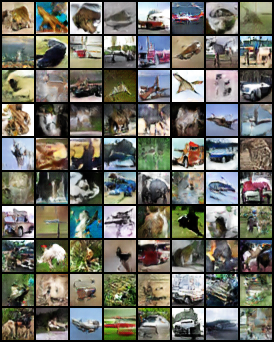


In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "5"
import random

import torch
import torch.nn as nn
import torch.backends.cudnn as cudnn

import torchvision
from torchvision import datasets
from torchvision import transforms # 张量变换
from torchvision.utils import save_image # 保存图片
from torch.nn.utils.spectral_norm import spectral_norm

import numpy as np

from itertools import product # draw 10 * 10 images
from tqdm import tqdm
import matplotlib.pyplot as plt
# Enable Jupyter notebook plotting
%matplotlib inline

# Pytorch Version
print(torch.__version__)
print(torch.cuda.is_available())

1.7.0
True


# Hyper Parameters

In [2]:
cudnn.benchmark = True

#set manual seed to a constant get a consistent output
manualSeed = random.randint(1, 10000)
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

batch_size = 128
num_epoch = 300
softlabel = 0 # 不要超过0.5！

ngf = 64  # base dimesion of G's feature
ndf = 64 # base dimesion of D's feature
z_dim = 300 # size of input noise's channel

nc = 3 # channels of output images

lr_G = 2e-4
lr_D = 2e-4 # leanring rate of Generator and Discriminator
D_step = 5

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

Random Seed:  9549
cuda:0


# Datasets files & utils

In [3]:
# the path we save data
if not os.path.exists('../../img'):
    os.mkdir('../../img')

# Transform of our datasets
trans = transforms.Compose([
                            transforms.ToTensor(),
                            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
                                       ])
    
# CIFAR10 datasets downloading……
cifar10 = datasets.CIFAR10(
    root = '../../data/cifar10/', train = True, transform = trans, download = True
)

# Dataloader
dataloader = torch.utils.data.DataLoader(
    dataset = cifar10, batch_size = batch_size, shuffle = True, num_workers = 8,
)



Files already downloaded and verified


In [4]:
inv_normalize = transforms.Normalize(
    mean=[-0.5/0.5, -0.5/0.5, -0.5/0.5],
    std=[1/0.5, 1/0.5, 1/0.5]
)
# inv_tensor = inv_normalize(tensor)



# Discriminator(Critic) Definitions (Wasserstein DCGAN Fashion)
 Critic (not trained to classify). 
 
- 输入一张图片
- 输出是近似真实图片与 $z\sim P(G(z))$ 的近似 Wasserstein 距离 output is the approximate Wasserstein Distance between $z\sim P(G(z))$ and real.


理论上判别器的输出是无界的，所以最后不需要Sigmoid()

It is a **unconditional** version.

In [5]:

class discriminator(nn.Module):
    def __init__(self):
        super(discriminator, self).__init__()
        self.D = nn.Sequential(
            # input is (nc) x 32 x 32
            spectral_norm(nn.Conv2d(nc, ndf, kernel_size = 4,
                      stride = 2, padding = 1)),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 16 x 16
            spectral_norm(nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False)),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 8 x 18
            spectral_norm(nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False)),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 4 x 4
            spectral_norm(nn.Conv2d(ndf * 4, 1, 4, 1, 0, bias=False)),
            nn.Sigmoid()
        )
        
    
    def forward(self, x):
        x = self.D(x)
        return x

# Generator Definitions (Vanilla DCGAN Fashion)
The generator, $G$, is designed to map the latent space vector $(z)$ to data-space. Since our data are images, converting z to data-space means ultimately creating a RGB image with the same size as the training images (i.e. 3x64x64). In practice, this is accomplished through a series of strided two dimensional convolutional transpose layers, each paired with a 2d batch norm layer and a relu activation. The output of the generator is fed through a tanh function to return it to the input data range of $[−1,1]$. It is worth noting the existence of the batch norm functions after the conv-transpose layers, as this is a critical contribution of the DCGAN paper. These layers help with the flow of gradients during training. An image of the generator from the DCGAN paper is shown below.

The generator, G, is designed to map the latent space vector $(z)$ to data-space. Since our data are images, converting z to data-space means ultimately creating a RGB image with the same size as the training images (i.e. 3x64x64). In practice, this is accomplished through a series of strided two dimensional convolutional transpose layers, each paired with a 2d batch norm layer and a relu activation. The output of the generator is fed through a tanh function to return it to the input data range of $[−1,1]$. It is worth noting the existence of the batch norm functions after the conv-transpose layers, as this is a critical contribution of the DCGAN paper. These layers help with the flow of gradients during training. An image of the generator from the DCGAN paper is shown below.

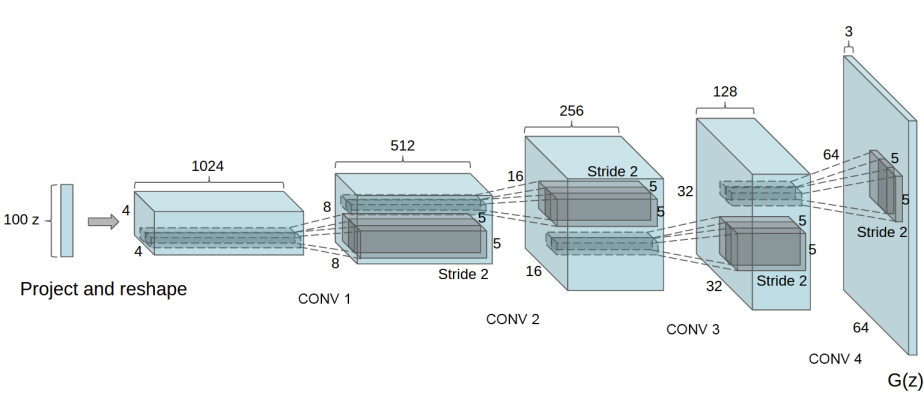

The final `Tanh` activataion function can project output into (-1,1)

Notice, the how the inputs we set in the input section (nz, ngf, and nc) influence the generator architecture in code. nz is the length of the z input vector, ngf relates to the size of the feature maps that are propagated through the generator, and nc is the number of channels in the output image (set to 3 for RGB images). Below is the code for the generator.


It is a **unconditional** version.

In [6]:

class generator(nn.Module):
    
    def __init__(self):
        super(generator, self).__init__()
        self.G = nn.Sequential(
            nn.ConvTranspose2d(z_dim, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            
            nn.ConvTranspose2d(ngf * 8, ngf * 4, kernel_size=4,
                              stride=2, padding=1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            
            nn.ConvTranspose2d(ngf * 4, ngf * 2, kernel_size=4,
                              stride=2, padding=1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d(ngf * 2, nc, kernel_size=4,
                              stride=2, padding=1, bias=False),
            # state size. nc x 32 x 32            
            nn.Tanh()
            )
        
    def forward(self, x):
        x = self.G(x)
        return x
        
        

## Weight Initialization
From the DCGAN paper, the authors specify that all model weights shall be randomly initialized from a Normal distribution with mean=0, stdev=0.02. The weights_init function takes an initialized model as input and reinitializes all convolutional, convolutional-transpose, and batch normalization layers to meet this criteria. This function is applied to the models immediately after initialization.

WGAN并没有说明要不要初始化来着，先留着看看


In [7]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

# Traning Phase
## Model & Opitmizer

In [8]:


D = discriminator()
G = generator()
D.apply(weights_init)
G.apply(weights_init)
# TODO: 自定义初始化

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

D = D.to(device)
G = G.to(device)




In [9]:
criterion = nn.BCELoss() # 二分类交叉熵

d_optimizer = torch.optim.Adam(D.parameters(), lr = lr_D, betas=(0.5,0.999))
g_optimizer = torch.optim.Adam(G.parameters(), lr = lr_G, betas=(0.5,0.999))

## Trainning Start!

  0%|          | 0/300 [00:00<?, ?it/s]

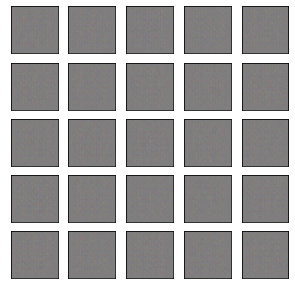

Epoch[0/300],d_loss:1.383320,g_loss:0.670241 D real: 0.505448,D fake: 0.511585
Epoch[0/300],d_loss:0.073713,g_loss:3.413507 D real: 0.983576,D fake: 0.033177
Epoch[0/300],d_loss:0.018754,g_loss:4.295940 D real: 0.995252,D fake: 0.013754
Epoch[0/300],d_loss:0.054256,g_loss:4.275290 D real: 0.979067,D fake: 0.014026


  0%|          | 1/300 [00:16<1:23:20, 16.72s/it]

Epoch[1/300],d_loss:0.289011,g_loss:2.243276 D real: 0.960926,D fake: 0.108459
Epoch[1/300],d_loss:0.048530,g_loss:4.786087 D real: 0.970784,D fake: 0.008381
Epoch[1/300],d_loss:0.029806,g_loss:5.676396 D real: 0.981043,D fake: 0.003480
Epoch[1/300],d_loss:0.043352,g_loss:3.606345 D real: 0.987930,D fake: 0.027755


  1%|          | 2/300 [00:31<1:19:26, 16.00s/it]

Epoch[2/300],d_loss:0.219216,g_loss:5.033636 D real: 0.980387,D fake: 0.006724
Epoch[2/300],d_loss:0.121443,g_loss:3.228877 D real: 0.948148,D fake: 0.040290
Epoch[2/300],d_loss:0.149133,g_loss:2.437296 D real: 0.946863,D fake: 0.117646
Epoch[2/300],d_loss:0.026553,g_loss:4.566354 D real: 0.988104,D fake: 0.011012


  1%|          | 3/300 [00:45<1:17:21, 15.63s/it]

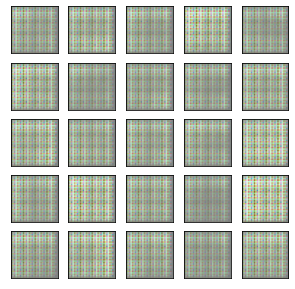

Epoch[3/300],d_loss:0.082067,g_loss:3.550743 D real: 0.978612,D fake: 0.033480
Epoch[3/300],d_loss:0.194689,g_loss:3.091030 D real: 0.888593,D fake: 0.045649
Epoch[3/300],d_loss:0.088384,g_loss:3.421983 D real: 0.965815,D fake: 0.033648
Epoch[3/300],d_loss:0.132644,g_loss:3.076499 D real: 0.934175,D fake: 0.051491


  1%|▏         | 4/300 [01:00<1:16:18, 15.47s/it]

Epoch[4/300],d_loss:0.300663,g_loss:3.005078 D real: 0.970314,D fake: 0.065288
Epoch[4/300],d_loss:0.162879,g_loss:2.390436 D real: 0.937644,D fake: 0.099345
Epoch[4/300],d_loss:0.097087,g_loss:3.671658 D real: 0.948575,D fake: 0.036436
Epoch[4/300],d_loss:0.213511,g_loss:3.158338 D real: 0.933422,D fake: 0.060265


  2%|▏         | 5/300 [01:15<1:14:53, 15.23s/it]

Epoch[5/300],d_loss:0.137410,g_loss:3.685468 D real: 0.970105,D fake: 0.051819
Epoch[5/300],d_loss:0.075624,g_loss:3.632692 D real: 0.975114,D fake: 0.030689
Epoch[5/300],d_loss:0.286267,g_loss:2.509190 D real: 0.895995,D fake: 0.084600
Epoch[5/300],d_loss:0.299716,g_loss:2.587888 D real: 0.883826,D fake: 0.082922


  2%|▏         | 6/300 [01:29<1:12:39, 14.83s/it]

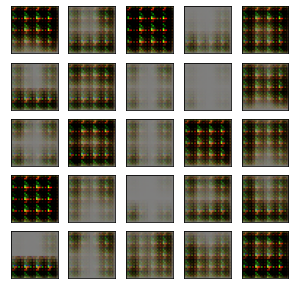

Epoch[6/300],d_loss:0.122152,g_loss:3.378239 D real: 0.957831,D fake: 0.047551
Epoch[6/300],d_loss:0.091274,g_loss:3.908501 D real: 0.961490,D fake: 0.031768
Epoch[6/300],d_loss:0.088144,g_loss:2.988228 D real: 0.969613,D fake: 0.057491
Epoch[6/300],d_loss:0.118738,g_loss:3.386940 D real: 0.949692,D fake: 0.066346


  2%|▏         | 7/300 [01:44<1:13:02, 14.96s/it]

Epoch[7/300],d_loss:0.174488,g_loss:3.615665 D real: 0.948616,D fake: 0.044692
Epoch[7/300],d_loss:0.215827,g_loss:3.214414 D real: 0.907735,D fake: 0.047648
Epoch[7/300],d_loss:0.109346,g_loss:3.618606 D real: 0.947071,D fake: 0.041823
Epoch[7/300],d_loss:0.117330,g_loss:3.271034 D real: 0.938020,D fake: 0.060164


  3%|▎         | 8/300 [01:58<1:10:49, 14.55s/it]

Epoch[8/300],d_loss:0.267385,g_loss:4.280396 D real: 0.939481,D fake: 0.041890
Epoch[8/300],d_loss:0.182693,g_loss:3.311800 D real: 0.961443,D fake: 0.050244
Epoch[8/300],d_loss:0.223744,g_loss:2.609434 D real: 0.942707,D fake: 0.129421
Epoch[8/300],d_loss:0.220981,g_loss:2.582031 D real: 0.900047,D fake: 0.117020


  3%|▎         | 9/300 [02:12<1:09:34, 14.34s/it]

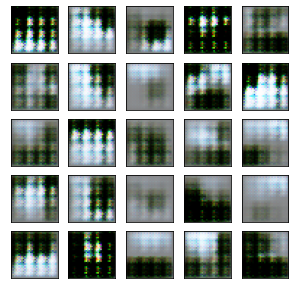

Epoch[9/300],d_loss:0.464188,g_loss:3.259233 D real: 0.942765,D fake: 0.060989
Epoch[9/300],d_loss:0.212431,g_loss:3.060704 D real: 0.919197,D fake: 0.076042
Epoch[9/300],d_loss:0.238695,g_loss:2.791407 D real: 0.893461,D fake: 0.077087
Epoch[9/300],d_loss:0.193546,g_loss:2.993860 D real: 0.936087,D fake: 0.065185


  3%|▎         | 10/300 [02:25<1:08:24, 14.15s/it]

Epoch[10/300],d_loss:0.365992,g_loss:3.426600 D real: 0.938267,D fake: 0.053433
Epoch[10/300],d_loss:0.268940,g_loss:2.835072 D real: 0.877326,D fake: 0.079347
Epoch[10/300],d_loss:0.220707,g_loss:2.701757 D real: 0.938313,D fake: 0.077337
Epoch[10/300],d_loss:0.213165,g_loss:2.702145 D real: 0.897733,D fake: 0.084056


  4%|▎         | 11/300 [02:39<1:07:24, 13.99s/it]

Epoch[11/300],d_loss:0.567018,g_loss:2.870700 D real: 0.860119,D fake: 0.066796
Epoch[11/300],d_loss:0.387383,g_loss:2.260323 D real: 0.816276,D fake: 0.123160
Epoch[11/300],d_loss:0.214085,g_loss:2.662288 D real: 0.948413,D fake: 0.079561
Epoch[11/300],d_loss:0.241490,g_loss:2.628392 D real: 0.899014,D fake: 0.085760


  4%|▍         | 12/300 [02:53<1:06:31, 13.86s/it]

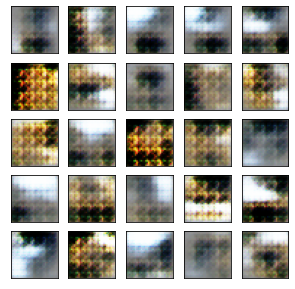

Epoch[12/300],d_loss:0.443959,g_loss:2.940695 D real: 0.895739,D fake: 0.062985
Epoch[12/300],d_loss:0.153876,g_loss:2.887524 D real: 0.946618,D fake: 0.063642
Epoch[12/300],d_loss:0.164018,g_loss:2.828932 D real: 0.927042,D fake: 0.068519
Epoch[12/300],d_loss:0.174926,g_loss:2.874295 D real: 0.925298,D fake: 0.067947


  4%|▍         | 13/300 [03:09<1:09:53, 14.61s/it]

Epoch[13/300],d_loss:0.308263,g_loss:3.168229 D real: 0.933529,D fake: 0.048822
Epoch[13/300],d_loss:0.246337,g_loss:2.863028 D real: 0.876216,D fake: 0.068270
Epoch[13/300],d_loss:0.181671,g_loss:3.062860 D real: 0.936270,D fake: 0.057062
Epoch[13/300],d_loss:0.215644,g_loss:2.758725 D real: 0.901525,D fake: 0.071177


  5%|▍         | 14/300 [03:23<1:08:11, 14.31s/it]

Epoch[14/300],d_loss:0.358117,g_loss:2.571651 D real: 0.886032,D fake: 0.106074
Epoch[14/300],d_loss:0.186483,g_loss:2.677019 D real: 0.946829,D fake: 0.083782
Epoch[14/300],d_loss:0.322103,g_loss:2.210332 D real: 0.885884,D fake: 0.123406
Epoch[14/300],d_loss:0.258232,g_loss:2.509618 D real: 0.915462,D fake: 0.089981


  5%|▌         | 15/300 [03:36<1:07:15, 14.16s/it]

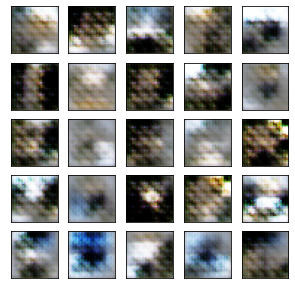

Epoch[15/300],d_loss:0.546105,g_loss:2.683590 D real: 0.911895,D fake: 0.084450
Epoch[15/300],d_loss:0.194683,g_loss:2.804610 D real: 0.933744,D fake: 0.071458
Epoch[15/300],d_loss:0.218780,g_loss:2.600527 D real: 0.922597,D fake: 0.097556
Epoch[15/300],d_loss:0.255914,g_loss:2.224495 D real: 0.884389,D fake: 0.121697


  5%|▌         | 16/300 [03:52<1:09:24, 14.66s/it]

Epoch[16/300],d_loss:0.452590,g_loss:2.709327 D real: 0.863099,D fake: 0.077706
Epoch[16/300],d_loss:0.312189,g_loss:2.262353 D real: 0.864902,D fake: 0.116646
Epoch[16/300],d_loss:0.357216,g_loss:2.458544 D real: 0.819095,D fake: 0.104736
Epoch[16/300],d_loss:0.331081,g_loss:2.352373 D real: 0.855009,D fake: 0.107075


  6%|▌         | 17/300 [04:06<1:08:19, 14.49s/it]

Epoch[17/300],d_loss:0.487874,g_loss:1.974682 D real: 0.822160,D fake: 0.162557
Epoch[17/300],d_loss:0.296575,g_loss:2.215951 D real: 0.862698,D fake: 0.126860
Epoch[17/300],d_loss:0.250086,g_loss:2.808180 D real: 0.863610,D fake: 0.072975
Epoch[17/300],d_loss:0.231956,g_loss:2.830077 D real: 0.908859,D fake: 0.070537


  6%|▌         | 18/300 [04:21<1:07:46, 14.42s/it]

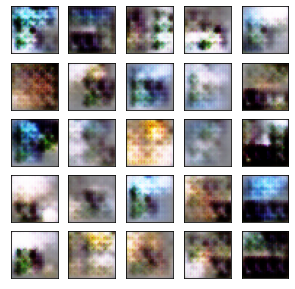

Epoch[18/300],d_loss:0.665010,g_loss:3.138458 D real: 0.905244,D fake: 0.055311
Epoch[18/300],d_loss:0.333032,g_loss:2.443267 D real: 0.842946,D fake: 0.108084
Epoch[18/300],d_loss:0.249352,g_loss:2.801486 D real: 0.852065,D fake: 0.068524
Epoch[18/300],d_loss:0.256855,g_loss:2.430912 D real: 0.875822,D fake: 0.098605


  6%|▋         | 19/300 [04:38<1:11:10, 15.20s/it]

Epoch[19/300],d_loss:0.480858,g_loss:2.459969 D real: 0.848746,D fake: 0.108137
Epoch[19/300],d_loss:0.269646,g_loss:2.437397 D real: 0.859401,D fake: 0.097906
Epoch[19/300],d_loss:0.392610,g_loss:2.013364 D real: 0.809498,D fake: 0.148224
Epoch[19/300],d_loss:0.377028,g_loss:2.036402 D real: 0.810765,D fake: 0.143791


  7%|▋         | 20/300 [04:51<1:08:50, 14.75s/it]

Epoch[20/300],d_loss:0.306578,g_loss:2.743731 D real: 0.896675,D fake: 0.071644
Epoch[20/300],d_loss:0.381964,g_loss:2.119800 D real: 0.806440,D fake: 0.137842
Epoch[20/300],d_loss:0.286254,g_loss:2.416974 D real: 0.886135,D fake: 0.100312
Epoch[20/300],d_loss:0.302652,g_loss:2.429019 D real: 0.861715,D fake: 0.096332


  7%|▋         | 21/300 [05:05<1:06:49, 14.37s/it]

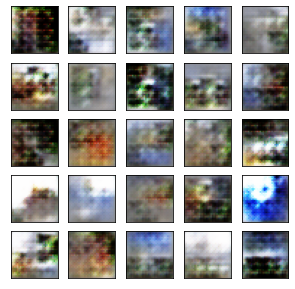

Epoch[21/300],d_loss:0.818146,g_loss:2.900811 D real: 0.891477,D fake: 0.068278
Epoch[21/300],d_loss:0.448796,g_loss:1.816862 D real: 0.766836,D fake: 0.197318
Epoch[21/300],d_loss:0.439392,g_loss:1.936007 D real: 0.804048,D fake: 0.158289
Epoch[21/300],d_loss:0.348602,g_loss:2.057344 D real: 0.828043,D fake: 0.148326


  7%|▋         | 22/300 [05:19<1:06:14, 14.30s/it]

Epoch[22/300],d_loss:0.525303,g_loss:2.166300 D real: 0.831465,D fake: 0.131233
Epoch[22/300],d_loss:0.451805,g_loss:1.800160 D real: 0.758777,D fake: 0.180137
Epoch[22/300],d_loss:0.389265,g_loss:2.119436 D real: 0.812687,D fake: 0.132526
Epoch[22/300],d_loss:0.316722,g_loss:2.225843 D real: 0.862954,D fake: 0.139503


  8%|▊         | 23/300 [05:32<1:04:28, 13.97s/it]

Epoch[23/300],d_loss:0.455913,g_loss:2.200132 D real: 0.862760,D fake: 0.125848
Epoch[23/300],d_loss:0.401261,g_loss:1.974470 D real: 0.808248,D fake: 0.150141
Epoch[23/300],d_loss:0.414512,g_loss:1.954762 D real: 0.830099,D fake: 0.154914
Epoch[23/300],d_loss:0.395213,g_loss:2.118328 D real: 0.840989,D fake: 0.134764


  8%|▊         | 24/300 [05:47<1:05:11, 14.17s/it]

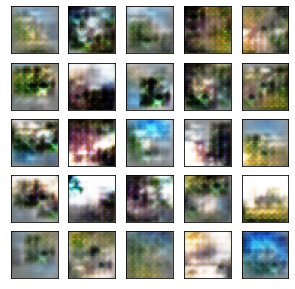

Epoch[24/300],d_loss:0.411360,g_loss:1.918136 D real: 0.827163,D fake: 0.158736
Epoch[24/300],d_loss:0.507412,g_loss:1.555942 D real: 0.763666,D fake: 0.231607
Epoch[24/300],d_loss:0.363258,g_loss:1.813053 D real: 0.842125,D fake: 0.175703
Epoch[24/300],d_loss:0.392618,g_loss:1.999021 D real: 0.817803,D fake: 0.144089


  8%|▊         | 25/300 [06:03<1:07:39, 14.76s/it]

Epoch[25/300],d_loss:0.756754,g_loss:2.047455 D real: 0.793476,D fake: 0.142116
Epoch[25/300],d_loss:0.424375,g_loss:2.191816 D real: 0.837525,D fake: 0.129055
Epoch[25/300],d_loss:0.490488,g_loss:1.727813 D real: 0.772208,D fake: 0.197927
Epoch[25/300],d_loss:0.420937,g_loss:1.832948 D real: 0.808456,D fake: 0.176237


  9%|▊         | 26/300 [06:17<1:06:59, 14.67s/it]

Epoch[26/300],d_loss:0.596252,g_loss:2.047976 D real: 0.798326,D fake: 0.145086
Epoch[26/300],d_loss:0.427967,g_loss:2.005824 D real: 0.821232,D fake: 0.150040
Epoch[26/300],d_loss:0.453136,g_loss:1.876297 D real: 0.794474,D fake: 0.173181
Epoch[26/300],d_loss:0.489060,g_loss:1.799482 D real: 0.809034,D fake: 0.180055


  9%|▉         | 27/300 [06:30<1:04:27, 14.17s/it]

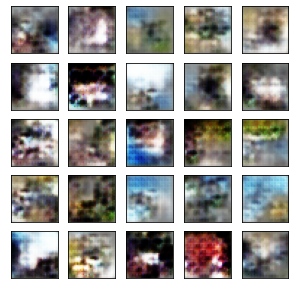

Epoch[27/300],d_loss:0.852554,g_loss:1.371081 D real: 0.733755,D fake: 0.288473
Epoch[27/300],d_loss:0.486351,g_loss:1.741298 D real: 0.786275,D fake: 0.192568
Epoch[27/300],d_loss:0.453119,g_loss:2.116007 D real: 0.776834,D fake: 0.141192
Epoch[27/300],d_loss:0.684637,g_loss:1.260057 D real: 0.664209,D fake: 0.301416


  9%|▉         | 28/300 [06:48<1:08:25, 15.09s/it]

Epoch[28/300],d_loss:0.590951,g_loss:1.896556 D real: 0.795855,D fake: 0.169439
Epoch[28/300],d_loss:0.451644,g_loss:1.906352 D real: 0.790679,D fake: 0.169236
Epoch[28/300],d_loss:0.381043,g_loss:1.922060 D real: 0.838169,D fake: 0.161855
Epoch[28/300],d_loss:0.515195,g_loss:1.682853 D real: 0.778149,D fake: 0.201889


 10%|▉         | 29/300 [07:01<1:06:24, 14.70s/it]

Epoch[29/300],d_loss:0.704065,g_loss:1.684121 D real: 0.758458,D fake: 0.200652
Epoch[29/300],d_loss:0.460640,g_loss:1.707663 D real: 0.786827,D fake: 0.189755
Epoch[29/300],d_loss:0.540437,g_loss:1.322369 D real: 0.751302,D fake: 0.282821
Epoch[29/300],d_loss:0.483989,g_loss:1.669401 D real: 0.760471,D fake: 0.207913


 10%|█         | 30/300 [07:15<1:04:54, 14.42s/it]

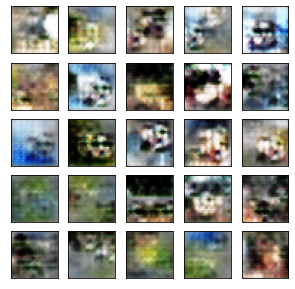

Epoch[30/300],d_loss:0.583452,g_loss:2.008697 D real: 0.809654,D fake: 0.147316
Epoch[30/300],d_loss:0.547412,g_loss:1.569313 D real: 0.729718,D fake: 0.222767
Epoch[30/300],d_loss:0.507258,g_loss:1.864018 D real: 0.760396,D fake: 0.181549
Epoch[30/300],d_loss:0.431502,g_loss:1.851975 D real: 0.790609,D fake: 0.180348


 10%|█         | 31/300 [07:30<1:05:38, 14.64s/it]

Epoch[31/300],d_loss:0.703049,g_loss:1.516487 D real: 0.732749,D fake: 0.237381
Epoch[31/300],d_loss:0.520988,g_loss:1.521672 D real: 0.780715,D fake: 0.241468
Epoch[31/300],d_loss:0.474391,g_loss:1.874099 D real: 0.796468,D fake: 0.167305
Epoch[31/300],d_loss:0.415524,g_loss:1.988171 D real: 0.821396,D fake: 0.152004


 11%|█         | 32/300 [07:45<1:05:21, 14.63s/it]

Epoch[32/300],d_loss:0.636597,g_loss:2.225416 D real: 0.826866,D fake: 0.125255
Epoch[32/300],d_loss:0.578058,g_loss:1.774666 D real: 0.780421,D fake: 0.186643
Epoch[32/300],d_loss:0.679509,g_loss:1.528329 D real: 0.716732,D fake: 0.241144
Epoch[32/300],d_loss:0.546463,g_loss:1.501725 D real: 0.761560,D fake: 0.241664


 11%|█         | 33/300 [07:59<1:05:03, 14.62s/it]

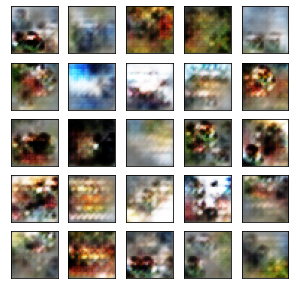

Epoch[33/300],d_loss:0.870674,g_loss:2.143989 D real: 0.768470,D fake: 0.128489
Epoch[33/300],d_loss:0.618745,g_loss:1.438536 D real: 0.719796,D fake: 0.250673
Epoch[33/300],d_loss:0.418956,g_loss:1.783058 D real: 0.803002,D fake: 0.182893
Epoch[33/300],d_loss:0.478726,g_loss:1.869620 D real: 0.795462,D fake: 0.164541


 11%|█▏        | 34/300 [08:15<1:05:34, 14.79s/it]

Epoch[34/300],d_loss:0.705154,g_loss:2.005347 D real: 0.780476,D fake: 0.166389
Epoch[34/300],d_loss:0.429552,g_loss:2.030748 D real: 0.822573,D fake: 0.144547
Epoch[34/300],d_loss:0.645334,g_loss:1.802915 D real: 0.770495,D fake: 0.204308
Epoch[34/300],d_loss:0.461582,g_loss:1.875204 D real: 0.750286,D fake: 0.173067


 12%|█▏        | 35/300 [08:28<1:03:49, 14.45s/it]

Epoch[35/300],d_loss:0.617094,g_loss:1.915411 D real: 0.831331,D fake: 0.158378
Epoch[35/300],d_loss:0.452687,g_loss:1.792688 D real: 0.825670,D fake: 0.180480
Epoch[35/300],d_loss:0.554840,g_loss:1.758055 D real: 0.789436,D fake: 0.187764
Epoch[35/300],d_loss:0.487337,g_loss:1.877486 D real: 0.792402,D fake: 0.162749


 12%|█▏        | 36/300 [08:41<1:01:24, 13.96s/it]

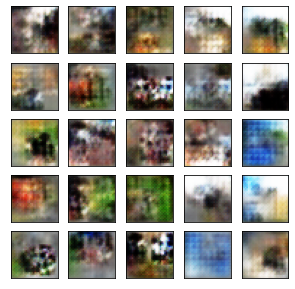

Epoch[36/300],d_loss:0.610084,g_loss:2.048287 D real: 0.828895,D fake: 0.136218
Epoch[36/300],d_loss:0.429374,g_loss:1.886660 D real: 0.786661,D fake: 0.165733
Epoch[36/300],d_loss:0.542910,g_loss:1.614048 D real: 0.775597,D fake: 0.215191
Epoch[36/300],d_loss:0.367747,g_loss:2.076855 D real: 0.826633,D fake: 0.136198


 12%|█▏        | 37/300 [08:57<1:03:49, 14.56s/it]

Epoch[37/300],d_loss:0.667076,g_loss:2.075216 D real: 0.749435,D fake: 0.134013
Epoch[37/300],d_loss:0.464022,g_loss:2.074991 D real: 0.797514,D fake: 0.138928
Epoch[37/300],d_loss:0.524606,g_loss:1.663252 D real: 0.769400,D fake: 0.205974
Epoch[37/300],d_loss:0.664520,g_loss:1.656043 D real: 0.673441,D fake: 0.214715


 13%|█▎        | 38/300 [09:10<1:02:01, 14.20s/it]

Epoch[38/300],d_loss:0.907085,g_loss:1.676434 D real: 0.751568,D fake: 0.209694
Epoch[38/300],d_loss:0.665609,g_loss:1.496505 D real: 0.680115,D fake: 0.240970
Epoch[38/300],d_loss:0.513077,g_loss:1.607351 D real: 0.767046,D fake: 0.212888
Epoch[38/300],d_loss:0.480923,g_loss:1.766909 D real: 0.771175,D fake: 0.188156


 13%|█▎        | 39/300 [09:23<59:41, 13.72s/it]  

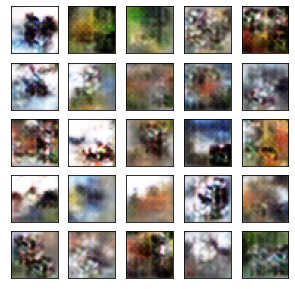

Epoch[39/300],d_loss:0.860178,g_loss:1.986821 D real: 0.759061,D fake: 0.156468
Epoch[39/300],d_loss:0.662237,g_loss:1.369041 D real: 0.716048,D fake: 0.272789
Epoch[39/300],d_loss:0.720415,g_loss:1.242205 D real: 0.661960,D fake: 0.303263
Epoch[39/300],d_loss:0.421899,g_loss:1.820450 D real: 0.789100,D fake: 0.176661


 13%|█▎        | 40/300 [09:36<57:58, 13.38s/it]

Epoch[40/300],d_loss:0.548028,g_loss:1.916178 D real: 0.802901,D fake: 0.173818
Epoch[40/300],d_loss:0.686591,g_loss:1.459796 D real: 0.722427,D fake: 0.248462
Epoch[40/300],d_loss:0.480002,g_loss:1.559199 D real: 0.782851,D fake: 0.225200
Epoch[40/300],d_loss:0.545473,g_loss:1.742791 D real: 0.739130,D fake: 0.207722


 14%|█▎        | 41/300 [09:50<58:43, 13.61s/it]

Epoch[41/300],d_loss:0.878750,g_loss:1.708200 D real: 0.749114,D fake: 0.195691
Epoch[41/300],d_loss:0.569796,g_loss:1.796949 D real: 0.748739,D fake: 0.179847
Epoch[41/300],d_loss:0.515102,g_loss:1.654986 D real: 0.750115,D fake: 0.217564
Epoch[41/300],d_loss:0.561575,g_loss:1.535503 D real: 0.752681,D fake: 0.237002


 14%|█▍        | 42/300 [10:04<59:17, 13.79s/it]

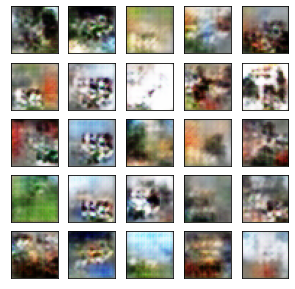

Epoch[42/300],d_loss:0.929217,g_loss:1.984652 D real: 0.835869,D fake: 0.160016
Epoch[42/300],d_loss:0.422838,g_loss:1.779501 D real: 0.759900,D fake: 0.181629
Epoch[42/300],d_loss:0.604838,g_loss:1.458197 D real: 0.690261,D fake: 0.260945
Epoch[42/300],d_loss:0.600780,g_loss:1.465052 D real: 0.719653,D fake: 0.243397


 14%|█▍        | 43/300 [10:20<1:02:29, 14.59s/it]

Epoch[43/300],d_loss:0.885387,g_loss:2.551704 D real: 0.828397,D fake: 0.091750
Epoch[43/300],d_loss:0.634884,g_loss:1.618215 D real: 0.697779,D fake: 0.207607
Epoch[43/300],d_loss:0.516983,g_loss:1.717349 D real: 0.761773,D fake: 0.198413
Epoch[43/300],d_loss:0.582260,g_loss:1.431947 D real: 0.715327,D fake: 0.255748


 15%|█▍        | 44/300 [10:34<1:01:14, 14.35s/it]

Epoch[44/300],d_loss:0.763483,g_loss:1.910456 D real: 0.773055,D fake: 0.163861
Epoch[44/300],d_loss:0.575407,g_loss:1.486909 D real: 0.731529,D fake: 0.239067
Epoch[44/300],d_loss:0.660970,g_loss:1.216568 D real: 0.685509,D fake: 0.324945
Epoch[44/300],d_loss:0.779345,g_loss:1.142495 D real: 0.633309,D fake: 0.340669


 15%|█▌        | 45/300 [10:49<1:01:21, 14.44s/it]

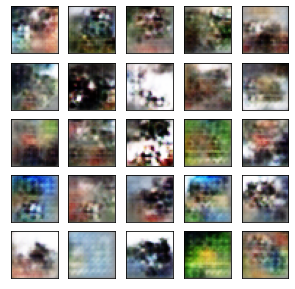

Epoch[45/300],d_loss:0.714823,g_loss:1.533972 D real: 0.773000,D fake: 0.227454
Epoch[45/300],d_loss:0.543015,g_loss:1.725182 D real: 0.725325,D fake: 0.194357
Epoch[45/300],d_loss:0.626551,g_loss:1.533216 D real: 0.724894,D fake: 0.235384
Epoch[45/300],d_loss:0.480424,g_loss:1.685131 D real: 0.795854,D fake: 0.199806


 15%|█▌        | 46/300 [11:06<1:03:54, 15.10s/it]

Epoch[46/300],d_loss:0.809482,g_loss:1.673981 D real: 0.788638,D fake: 0.199349
Epoch[46/300],d_loss:0.551767,g_loss:1.480483 D real: 0.785286,D fake: 0.244733
Epoch[46/300],d_loss:0.608767,g_loss:1.957418 D real: 0.834119,D fake: 0.156267
Epoch[46/300],d_loss:0.558904,g_loss:1.383454 D real: 0.718794,D fake: 0.261447


 16%|█▌        | 47/300 [11:20<1:02:54, 14.92s/it]

Epoch[47/300],d_loss:0.882589,g_loss:1.940360 D real: 0.766020,D fake: 0.157094
Epoch[47/300],d_loss:0.681170,g_loss:1.412673 D real: 0.656977,D fake: 0.253897
Epoch[47/300],d_loss:0.595061,g_loss:1.621817 D real: 0.780718,D fake: 0.208615
Epoch[47/300],d_loss:0.690818,g_loss:1.148845 D real: 0.670282,D fake: 0.330776


 16%|█▌        | 48/300 [11:36<1:03:24, 15.10s/it]

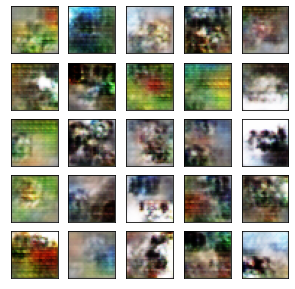

Epoch[48/300],d_loss:0.790200,g_loss:1.688951 D real: 0.766453,D fake: 0.198392
Epoch[48/300],d_loss:0.582911,g_loss:1.572662 D real: 0.774231,D fake: 0.227874
Epoch[48/300],d_loss:0.630456,g_loss:1.540504 D real: 0.725794,D fake: 0.233064
Epoch[48/300],d_loss:0.880309,g_loss:1.093448 D real: 0.616875,D fake: 0.359252


 16%|█▋        | 49/300 [11:50<1:02:33, 14.95s/it]

Epoch[49/300],d_loss:0.851967,g_loss:1.575331 D real: 0.707066,D fake: 0.226911
Epoch[49/300],d_loss:0.814687,g_loss:1.256300 D real: 0.676275,D fake: 0.297303
Epoch[49/300],d_loss:0.602678,g_loss:1.526539 D real: 0.735046,D fake: 0.233045
Epoch[49/300],d_loss:0.530985,g_loss:1.501786 D real: 0.763604,D fake: 0.239819


 17%|█▋        | 50/300 [12:04<1:00:37, 14.55s/it]

Epoch[50/300],d_loss:0.876539,g_loss:1.680534 D real: 0.793475,D fake: 0.201164
Epoch[50/300],d_loss:0.602133,g_loss:1.504415 D real: 0.752998,D fake: 0.235023
Epoch[50/300],d_loss:0.644904,g_loss:1.260694 D real: 0.662568,D fake: 0.301449
Epoch[50/300],d_loss:0.555330,g_loss:1.577253 D real: 0.758878,D fake: 0.221287


 17%|█▋        | 51/300 [12:19<1:00:42, 14.63s/it]

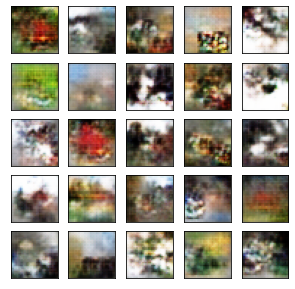

Epoch[51/300],d_loss:0.735134,g_loss:1.875174 D real: 0.793296,D fake: 0.167499
Epoch[51/300],d_loss:0.660825,g_loss:1.342041 D real: 0.676088,D fake: 0.281585
Epoch[51/300],d_loss:0.735868,g_loss:1.328799 D real: 0.701620,D fake: 0.284523
Epoch[51/300],d_loss:0.684812,g_loss:1.308441 D real: 0.665999,D fake: 0.284478


 17%|█▋        | 52/300 [12:34<1:01:06, 14.79s/it]

Epoch[52/300],d_loss:0.963287,g_loss:1.537227 D real: 0.781471,D fake: 0.230657
Epoch[52/300],d_loss:0.737335,g_loss:1.300474 D real: 0.712119,D fake: 0.291032
Epoch[52/300],d_loss:0.454046,g_loss:1.806279 D real: 0.796362,D fake: 0.176317
Epoch[52/300],d_loss:0.693148,g_loss:1.382828 D real: 0.701825,D fake: 0.263142


 18%|█▊        | 53/300 [12:48<1:00:22, 14.66s/it]

Epoch[53/300],d_loss:0.863404,g_loss:1.394132 D real: 0.709740,D fake: 0.266854
Epoch[53/300],d_loss:0.591250,g_loss:1.571271 D real: 0.763852,D fake: 0.223738
Epoch[53/300],d_loss:0.732516,g_loss:1.380912 D real: 0.709704,D fake: 0.270821
Epoch[53/300],d_loss:0.641800,g_loss:1.352802 D real: 0.721942,D fake: 0.273221


 18%|█▊        | 54/300 [13:01<57:50, 14.11s/it]  

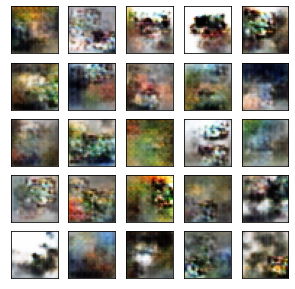

Epoch[54/300],d_loss:0.920725,g_loss:1.484270 D real: 0.711570,D fake: 0.238563
Epoch[54/300],d_loss:0.615505,g_loss:1.303818 D real: 0.722568,D fake: 0.285490
Epoch[54/300],d_loss:0.762299,g_loss:1.198716 D real: 0.671110,D fake: 0.311313
Epoch[54/300],d_loss:0.555407,g_loss:1.546362 D real: 0.755964,D fake: 0.225841


 18%|█▊        | 55/300 [13:14<56:43, 13.89s/it]

Epoch[55/300],d_loss:0.760623,g_loss:1.633890 D real: 0.729849,D fake: 0.214668
Epoch[55/300],d_loss:0.824875,g_loss:1.294669 D real: 0.652838,D fake: 0.288886
Epoch[55/300],d_loss:0.704805,g_loss:1.305703 D real: 0.691664,D fake: 0.301342
Epoch[55/300],d_loss:0.634438,g_loss:1.505784 D real: 0.720608,D fake: 0.237609


 19%|█▊        | 56/300 [13:29<57:00, 14.02s/it]

Epoch[56/300],d_loss:0.961970,g_loss:1.294093 D real: 0.705181,D fake: 0.289337
Epoch[56/300],d_loss:0.605888,g_loss:1.497845 D real: 0.719454,D fake: 0.236982
Epoch[56/300],d_loss:0.948754,g_loss:1.293504 D real: 0.621962,D fake: 0.298173
Epoch[56/300],d_loss:0.741323,g_loss:1.485687 D real: 0.705843,D fake: 0.246410


 19%|█▉        | 57/300 [13:43<56:41, 14.00s/it]

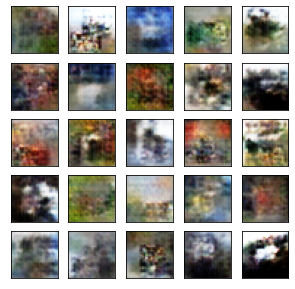

Epoch[57/300],d_loss:0.913905,g_loss:1.584618 D real: 0.780033,D fake: 0.219784
Epoch[57/300],d_loss:0.602416,g_loss:1.409558 D real: 0.741908,D fake: 0.258368
Epoch[57/300],d_loss:0.801046,g_loss:1.280056 D real: 0.654795,D fake: 0.303824
Epoch[57/300],d_loss:0.874498,g_loss:1.119363 D real: 0.618660,D fake: 0.344410


 19%|█▉        | 58/300 [13:57<56:57, 14.12s/it]

Epoch[58/300],d_loss:0.826386,g_loss:1.602073 D real: 0.741044,D fake: 0.224579
Epoch[58/300],d_loss:0.471295,g_loss:1.805296 D real: 0.784861,D fake: 0.176635
Epoch[58/300],d_loss:0.647183,g_loss:1.431849 D real: 0.736329,D fake: 0.255910
Epoch[58/300],d_loss:0.585967,g_loss:1.512864 D real: 0.728315,D fake: 0.240590


 20%|█▉        | 59/300 [14:11<56:55, 14.17s/it]

Epoch[59/300],d_loss:0.826696,g_loss:1.580426 D real: 0.746887,D fake: 0.220944
Epoch[59/300],d_loss:0.660562,g_loss:1.404355 D real: 0.715186,D fake: 0.268083
Epoch[59/300],d_loss:0.658902,g_loss:1.484202 D real: 0.733191,D fake: 0.242257
Epoch[59/300],d_loss:0.647476,g_loss:1.470750 D real: 0.728287,D fake: 0.252727


 20%|██        | 60/300 [14:25<56:38, 14.16s/it]

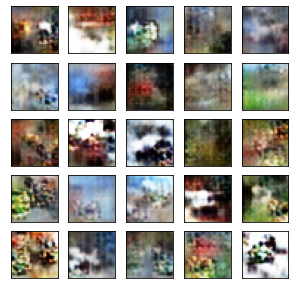

Epoch[60/300],d_loss:0.779329,g_loss:1.723854 D real: 0.784200,D fake: 0.195307
Epoch[60/300],d_loss:0.712318,g_loss:1.679533 D real: 0.758952,D fake: 0.199787
Epoch[60/300],d_loss:0.610352,g_loss:1.455122 D real: 0.710867,D fake: 0.256833
Epoch[60/300],d_loss:0.665725,g_loss:1.281412 D real: 0.688996,D fake: 0.291906


 20%|██        | 61/300 [14:41<58:00, 14.56s/it]

Epoch[61/300],d_loss:0.809848,g_loss:1.429585 D real: 0.709439,D fake: 0.279929
Epoch[61/300],d_loss:0.465767,g_loss:1.717346 D real: 0.771858,D fake: 0.193319
Epoch[61/300],d_loss:0.666214,g_loss:1.303801 D real: 0.718272,D fake: 0.287546
Epoch[61/300],d_loss:0.749003,g_loss:1.348442 D real: 0.664355,D fake: 0.284082


 21%|██        | 62/300 [14:55<57:17, 14.44s/it]

Epoch[62/300],d_loss:0.895572,g_loss:1.211005 D real: 0.679166,D fake: 0.313585
Epoch[62/300],d_loss:0.778991,g_loss:1.186149 D real: 0.653597,D fake: 0.328063
Epoch[62/300],d_loss:0.638937,g_loss:1.365187 D real: 0.699277,D fake: 0.268680
Epoch[62/300],d_loss:0.687337,g_loss:1.341381 D real: 0.689511,D fake: 0.277015


 21%|██        | 63/300 [15:09<56:45, 14.37s/it]

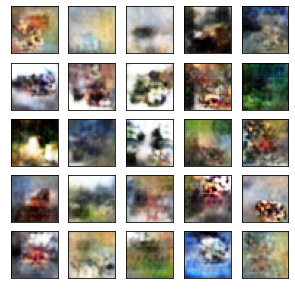

Epoch[63/300],d_loss:1.046903,g_loss:1.464177 D real: 0.749834,D fake: 0.243142
Epoch[63/300],d_loss:0.640930,g_loss:1.440287 D real: 0.740384,D fake: 0.245935
Epoch[63/300],d_loss:0.564687,g_loss:1.530574 D real: 0.766692,D fake: 0.227099
Epoch[63/300],d_loss:0.553135,g_loss:1.406391 D real: 0.767744,D fake: 0.253934


 21%|██▏       | 64/300 [15:24<56:49, 14.45s/it]

Epoch[64/300],d_loss:0.941174,g_loss:1.754361 D real: 0.744330,D fake: 0.187682
Epoch[64/300],d_loss:0.665124,g_loss:1.452208 D real: 0.716851,D fake: 0.248454
Epoch[64/300],d_loss:0.766792,g_loss:1.279802 D real: 0.674433,D fake: 0.294555
Epoch[64/300],d_loss:0.606014,g_loss:1.400766 D real: 0.749435,D fake: 0.261709


 22%|██▏       | 65/300 [15:38<56:33, 14.44s/it]

Epoch[65/300],d_loss:0.850873,g_loss:1.634322 D real: 0.777910,D fake: 0.208378
Epoch[65/300],d_loss:0.747934,g_loss:1.012235 D real: 0.636166,D fake: 0.377189
Epoch[65/300],d_loss:0.799088,g_loss:1.224692 D real: 0.683548,D fake: 0.310481
Epoch[65/300],d_loss:0.687068,g_loss:1.388208 D real: 0.689051,D fake: 0.269773


 22%|██▏       | 66/300 [15:53<57:00, 14.62s/it]

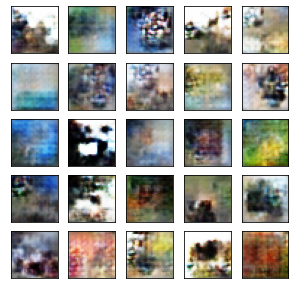

Epoch[66/300],d_loss:0.915759,g_loss:1.380500 D real: 0.733266,D fake: 0.263275
Epoch[66/300],d_loss:0.719409,g_loss:1.310454 D real: 0.641300,D fake: 0.294247
Epoch[66/300],d_loss:0.775521,g_loss:1.407490 D real: 0.711192,D fake: 0.256102
Epoch[66/300],d_loss:0.948722,g_loss:1.023630 D real: 0.611165,D fake: 0.381365


 22%|██▏       | 67/300 [16:10<58:55, 15.17s/it]

Epoch[67/300],d_loss:0.779579,g_loss:1.527809 D real: 0.736054,D fake: 0.229005
Epoch[67/300],d_loss:0.750440,g_loss:1.198277 D real: 0.697220,D fake: 0.313847
Epoch[67/300],d_loss:0.657336,g_loss:1.320045 D real: 0.748346,D fake: 0.289843
Epoch[67/300],d_loss:0.789772,g_loss:1.094134 D real: 0.634129,D fake: 0.344868


 23%|██▎       | 68/300 [16:24<57:49, 14.95s/it]

Epoch[68/300],d_loss:0.902975,g_loss:1.092062 D real: 0.674611,D fake: 0.348683
Epoch[68/300],d_loss:0.689203,g_loss:1.330634 D real: 0.707320,D fake: 0.276278
Epoch[68/300],d_loss:0.900162,g_loss:0.982298 D real: 0.592910,D fake: 0.389210
Epoch[68/300],d_loss:0.839652,g_loss:1.245513 D real: 0.653529,D fake: 0.299765


 23%|██▎       | 69/300 [16:38<56:09, 14.59s/it]

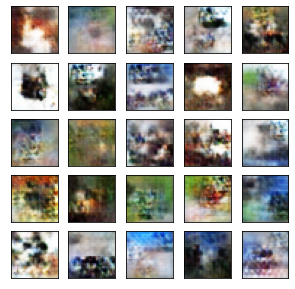

Epoch[69/300],d_loss:0.759319,g_loss:1.445187 D real: 0.756197,D fake: 0.246793
Epoch[69/300],d_loss:0.811949,g_loss:1.088983 D real: 0.663874,D fake: 0.344518
Epoch[69/300],d_loss:0.702034,g_loss:1.293765 D real: 0.692932,D fake: 0.288310
Epoch[69/300],d_loss:0.745395,g_loss:1.127148 D real: 0.644369,D fake: 0.333601


 23%|██▎       | 70/300 [16:53<56:33, 14.75s/it]

Epoch[70/300],d_loss:0.791353,g_loss:1.791591 D real: 0.781130,D fake: 0.178718
Epoch[70/300],d_loss:0.883221,g_loss:1.284294 D real: 0.691108,D fake: 0.287738
Epoch[70/300],d_loss:0.795451,g_loss:1.055322 D real: 0.666539,D fake: 0.359288
Epoch[70/300],d_loss:0.833959,g_loss:1.140658 D real: 0.645640,D fake: 0.340470


 24%|██▎       | 71/300 [17:05<53:35, 14.04s/it]

Epoch[71/300],d_loss:0.880884,g_loss:1.201582 D real: 0.668284,D fake: 0.309792
Epoch[71/300],d_loss:0.723202,g_loss:1.266243 D real: 0.653879,D fake: 0.297284
Epoch[71/300],d_loss:0.836854,g_loss:1.274514 D real: 0.670531,D fake: 0.294292
Epoch[71/300],d_loss:0.816647,g_loss:1.191053 D real: 0.661569,D fake: 0.325128


 24%|██▍       | 72/300 [17:18<51:58, 13.68s/it]

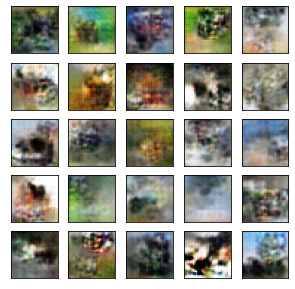

Epoch[72/300],d_loss:0.911119,g_loss:1.325566 D real: 0.723032,D fake: 0.280950
Epoch[72/300],d_loss:0.787554,g_loss:1.348605 D real: 0.714511,D fake: 0.274090
Epoch[72/300],d_loss:0.765457,g_loss:1.390799 D real: 0.667360,D fake: 0.268781
Epoch[72/300],d_loss:0.662681,g_loss:1.287212 D real: 0.691026,D fake: 0.292440


 24%|██▍       | 73/300 [17:35<55:07, 14.57s/it]

Epoch[73/300],d_loss:1.003744,g_loss:1.243193 D real: 0.679357,D fake: 0.306695
Epoch[73/300],d_loss:0.763999,g_loss:1.205048 D real: 0.683044,D fake: 0.313477
Epoch[73/300],d_loss:0.689334,g_loss:1.155166 D real: 0.644715,D fake: 0.327216
Epoch[73/300],d_loss:0.779073,g_loss:1.152297 D real: 0.645462,D fake: 0.336568


 25%|██▍       | 74/300 [17:49<54:48, 14.55s/it]

Epoch[74/300],d_loss:0.934411,g_loss:1.368520 D real: 0.740415,D fake: 0.267220
Epoch[74/300],d_loss:0.827559,g_loss:1.051362 D real: 0.678931,D fake: 0.367808
Epoch[74/300],d_loss:0.639339,g_loss:1.298627 D real: 0.685632,D fake: 0.288284
Epoch[74/300],d_loss:0.790862,g_loss:1.477603 D real: 0.725168,D fake: 0.244660


 25%|██▌       | 75/300 [18:03<53:25, 14.25s/it]

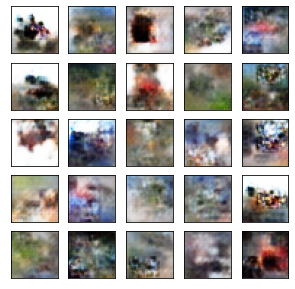

Epoch[75/300],d_loss:0.957827,g_loss:1.313281 D real: 0.663475,D fake: 0.287282
Epoch[75/300],d_loss:0.755643,g_loss:1.116785 D real: 0.674523,D fake: 0.339816
Epoch[75/300],d_loss:0.854291,g_loss:1.149142 D real: 0.652936,D fake: 0.332405
Epoch[75/300],d_loss:0.795662,g_loss:1.090278 D real: 0.615411,D fake: 0.346105


 25%|██▌       | 76/300 [18:20<55:42, 14.92s/it]

Epoch[76/300],d_loss:0.934132,g_loss:1.108536 D real: 0.622201,D fake: 0.343941
Epoch[76/300],d_loss:0.894393,g_loss:0.977515 D real: 0.598373,D fake: 0.389765
Epoch[76/300],d_loss:0.778318,g_loss:1.343169 D real: 0.702839,D fake: 0.273048
Epoch[76/300],d_loss:0.845822,g_loss:1.434310 D real: 0.672744,D fake: 0.246311


 26%|██▌       | 77/300 [18:34<54:33, 14.68s/it]

Epoch[77/300],d_loss:0.928968,g_loss:1.523723 D real: 0.772974,D fake: 0.231455
Epoch[77/300],d_loss:0.751522,g_loss:1.224635 D real: 0.639214,D fake: 0.305499
Epoch[77/300],d_loss:0.783128,g_loss:1.238317 D real: 0.649195,D fake: 0.304796
Epoch[77/300],d_loss:0.766990,g_loss:1.223548 D real: 0.688727,D fake: 0.304970


 26%|██▌       | 78/300 [18:48<53:47, 14.54s/it]

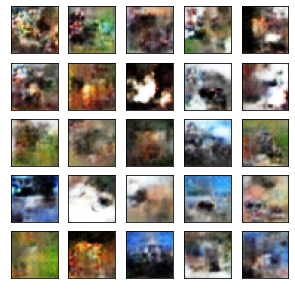

Epoch[78/300],d_loss:0.923045,g_loss:1.202312 D real: 0.647429,D fake: 0.314551
Epoch[78/300],d_loss:0.743408,g_loss:1.282612 D real: 0.706201,D fake: 0.291128
Epoch[78/300],d_loss:0.728246,g_loss:1.235586 D real: 0.691633,D fake: 0.308421
Epoch[78/300],d_loss:0.781836,g_loss:1.164448 D real: 0.697753,D fake: 0.327126


 26%|██▋       | 79/300 [19:03<54:40, 14.84s/it]

Epoch[79/300],d_loss:0.767142,g_loss:1.464074 D real: 0.721709,D fake: 0.254654
Epoch[79/300],d_loss:0.817547,g_loss:0.959332 D real: 0.646748,D fake: 0.389273
Epoch[79/300],d_loss:0.881841,g_loss:1.237879 D real: 0.721759,D fake: 0.304359
Epoch[79/300],d_loss:0.870352,g_loss:1.169125 D real: 0.645110,D fake: 0.321804


 27%|██▋       | 80/300 [19:18<53:40, 14.64s/it]

Epoch[80/300],d_loss:0.925867,g_loss:1.336600 D real: 0.673018,D fake: 0.274187
Epoch[80/300],d_loss:0.886098,g_loss:0.986035 D real: 0.658662,D fake: 0.383465
Epoch[80/300],d_loss:0.854028,g_loss:1.044968 D real: 0.591395,D fake: 0.363382
Epoch[80/300],d_loss:0.792789,g_loss:1.389334 D real: 0.713562,D fake: 0.257415


 27%|██▋       | 81/300 [19:32<53:14, 14.59s/it]

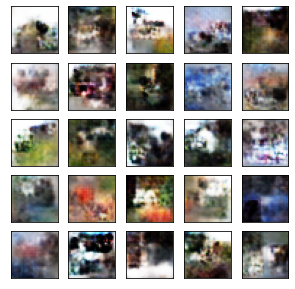

Epoch[81/300],d_loss:1.099936,g_loss:1.312179 D real: 0.680226,D fake: 0.296755
Epoch[81/300],d_loss:0.793449,g_loss:1.220568 D real: 0.672758,D fake: 0.303118
Epoch[81/300],d_loss:0.796776,g_loss:1.380625 D real: 0.725361,D fake: 0.263374
Epoch[81/300],d_loss:0.700157,g_loss:1.433771 D real: 0.721250,D fake: 0.255827


 27%|██▋       | 82/300 [19:49<55:19, 15.23s/it]

Epoch[82/300],d_loss:1.230608,g_loss:1.487905 D real: 0.632419,D fake: 0.261536
Epoch[82/300],d_loss:0.929083,g_loss:0.987696 D real: 0.613091,D fake: 0.387820
Epoch[82/300],d_loss:0.837388,g_loss:1.106463 D real: 0.642172,D fake: 0.345090
Epoch[82/300],d_loss:0.610758,g_loss:1.431853 D real: 0.745135,D fake: 0.250068


 28%|██▊       | 83/300 [20:04<54:37, 15.11s/it]

Epoch[83/300],d_loss:0.954725,g_loss:1.401258 D real: 0.691611,D fake: 0.260141
Epoch[83/300],d_loss:0.844055,g_loss:1.067255 D real: 0.636603,D fake: 0.359586
Epoch[83/300],d_loss:0.608953,g_loss:1.494768 D real: 0.730556,D fake: 0.235905
Epoch[83/300],d_loss:0.748545,g_loss:1.206585 D real: 0.682680,D fake: 0.309172


 28%|██▊       | 84/300 [20:17<52:45, 14.66s/it]

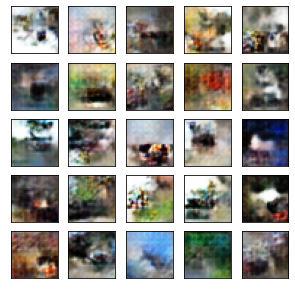

Epoch[84/300],d_loss:0.940980,g_loss:1.471318 D real: 0.704247,D fake: 0.250426
Epoch[84/300],d_loss:0.760261,g_loss:1.265031 D real: 0.670960,D fake: 0.294871
Epoch[84/300],d_loss:0.711154,g_loss:1.291679 D real: 0.666498,D fake: 0.286349
Epoch[84/300],d_loss:1.010453,g_loss:1.073314 D real: 0.604790,D fake: 0.358085


 28%|██▊       | 85/300 [20:33<54:07, 15.11s/it]

Epoch[85/300],d_loss:0.856514,g_loss:1.301943 D real: 0.674653,D fake: 0.285883
Epoch[85/300],d_loss:0.682181,g_loss:1.267290 D real: 0.694256,D fake: 0.292919
Epoch[85/300],d_loss:0.933040,g_loss:1.065567 D real: 0.643281,D fake: 0.353471
Epoch[85/300],d_loss:0.940837,g_loss:1.011390 D real: 0.586217,D fake: 0.375268


 29%|██▊       | 86/300 [20:46<50:56, 14.28s/it]

Epoch[86/300],d_loss:1.101503,g_loss:1.504320 D real: 0.728921,D fake: 0.239674
Epoch[86/300],d_loss:0.901192,g_loss:1.083837 D real: 0.690904,D fake: 0.350903
Epoch[86/300],d_loss:0.726367,g_loss:1.284872 D real: 0.680032,D fake: 0.291132
Epoch[86/300],d_loss:0.793575,g_loss:1.088467 D real: 0.638026,D fake: 0.345737


 29%|██▉       | 87/300 [20:58<49:05, 13.83s/it]

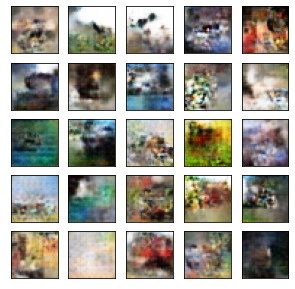

Epoch[87/300],d_loss:0.983194,g_loss:1.271266 D real: 0.704389,D fake: 0.293776
Epoch[87/300],d_loss:0.947528,g_loss:0.829768 D real: 0.544170,D fake: 0.448369
Epoch[87/300],d_loss:0.927408,g_loss:0.941298 D real: 0.570023,D fake: 0.403578
Epoch[87/300],d_loss:0.873292,g_loss:1.137789 D real: 0.640113,D fake: 0.338275


 29%|██▉       | 88/300 [21:15<51:59, 14.72s/it]

Epoch[88/300],d_loss:0.996741,g_loss:1.301253 D real: 0.685436,D fake: 0.285903
Epoch[88/300],d_loss:0.704278,g_loss:1.408392 D real: 0.692152,D fake: 0.265460
Epoch[88/300],d_loss:0.747918,g_loss:1.356416 D real: 0.689836,D fake: 0.284410
Epoch[88/300],d_loss:0.737141,g_loss:1.118408 D real: 0.659622,D fake: 0.337606


 30%|██▉       | 89/300 [21:29<51:11, 14.55s/it]

Epoch[89/300],d_loss:1.010068,g_loss:1.214128 D real: 0.670771,D fake: 0.310853
Epoch[89/300],d_loss:0.904430,g_loss:1.049003 D real: 0.693577,D fake: 0.363566
Epoch[89/300],d_loss:0.680475,g_loss:1.335266 D real: 0.726309,D fake: 0.272646
Epoch[89/300],d_loss:0.807822,g_loss:1.166369 D real: 0.691279,D fake: 0.321317


 30%|███       | 90/300 [21:44<51:10, 14.62s/it]

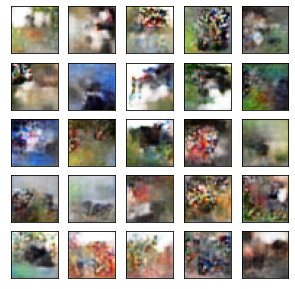

Epoch[90/300],d_loss:1.000929,g_loss:1.256653 D real: 0.658614,D fake: 0.294672
Epoch[90/300],d_loss:0.803688,g_loss:1.214167 D real: 0.675196,D fake: 0.310938
Epoch[90/300],d_loss:0.795522,g_loss:1.262719 D real: 0.668340,D fake: 0.296830
Epoch[90/300],d_loss:0.971866,g_loss:1.071550 D real: 0.629427,D fake: 0.364558


 30%|███       | 91/300 [22:00<52:13, 14.99s/it]

Epoch[91/300],d_loss:0.995332,g_loss:1.102447 D real: 0.655174,D fake: 0.361214
Epoch[91/300],d_loss:0.869427,g_loss:0.945741 D real: 0.613915,D fake: 0.400967
Epoch[91/300],d_loss:0.771306,g_loss:1.185856 D real: 0.674751,D fake: 0.316416
Epoch[91/300],d_loss:0.849111,g_loss:0.957133 D real: 0.604634,D fake: 0.396993


 31%|███       | 92/300 [22:15<52:04, 15.02s/it]

Epoch[92/300],d_loss:0.960130,g_loss:1.099836 D real: 0.684096,D fake: 0.349637
Epoch[92/300],d_loss:0.722569,g_loss:1.320822 D real: 0.715554,D fake: 0.276452
Epoch[92/300],d_loss:0.890309,g_loss:1.291347 D real: 0.610623,D fake: 0.287037
Epoch[92/300],d_loss:0.830773,g_loss:1.243524 D real: 0.679132,D fake: 0.299183


 31%|███       | 93/300 [22:30<51:33, 14.95s/it]

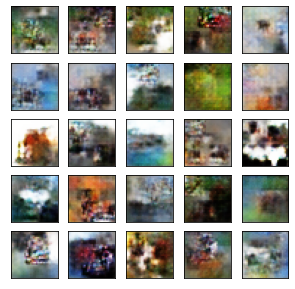

Epoch[93/300],d_loss:1.171617,g_loss:1.394957 D real: 0.643647,D fake: 0.265007
Epoch[93/300],d_loss:0.815594,g_loss:1.189033 D real: 0.651805,D fake: 0.314854
Epoch[93/300],d_loss:0.713506,g_loss:1.311334 D real: 0.722883,D fake: 0.288043
Epoch[93/300],d_loss:0.799570,g_loss:1.141799 D real: 0.651709,D fake: 0.329303


 31%|███▏      | 94/300 [22:47<53:13, 15.50s/it]

Epoch[94/300],d_loss:0.997704,g_loss:1.328922 D real: 0.668495,D fake: 0.283834
Epoch[94/300],d_loss:0.689302,g_loss:1.253516 D real: 0.709422,D fake: 0.305910
Epoch[94/300],d_loss:0.845262,g_loss:1.105065 D real: 0.624580,D fake: 0.343406
Epoch[94/300],d_loss:0.852504,g_loss:1.000789 D real: 0.599775,D fake: 0.383065


 32%|███▏      | 95/300 [23:01<51:31, 15.08s/it]

Epoch[95/300],d_loss:1.172427,g_loss:1.779846 D real: 0.723960,D fake: 0.200521
Epoch[95/300],d_loss:0.764038,g_loss:1.148583 D real: 0.684504,D fake: 0.332434
Epoch[95/300],d_loss:0.838565,g_loss:1.041729 D real: 0.637171,D fake: 0.361662
Epoch[95/300],d_loss:0.714980,g_loss:1.281997 D real: 0.674954,D fake: 0.291119


 32%|███▏      | 96/300 [23:16<51:48, 15.24s/it]

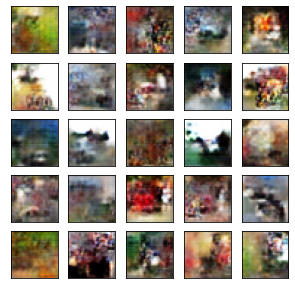

Epoch[96/300],d_loss:0.923355,g_loss:1.220339 D real: 0.647576,D fake: 0.306842
Epoch[96/300],d_loss:0.873483,g_loss:1.030536 D real: 0.609128,D fake: 0.368337
Epoch[96/300],d_loss:0.939345,g_loss:0.968178 D real: 0.617336,D fake: 0.386933
Epoch[96/300],d_loss:0.754867,g_loss:1.347497 D real: 0.672943,D fake: 0.270609


 32%|███▏      | 97/300 [23:34<53:42, 15.87s/it]

Epoch[97/300],d_loss:0.996729,g_loss:1.191966 D real: 0.672444,D fake: 0.312458
Epoch[97/300],d_loss:0.867955,g_loss:1.312961 D real: 0.759536,D fake: 0.277847
Epoch[97/300],d_loss:0.756494,g_loss:1.116177 D real: 0.678672,D fake: 0.334667
Epoch[97/300],d_loss:0.811819,g_loss:1.267586 D real: 0.724128,D fake: 0.289477


 33%|███▎      | 98/300 [23:48<51:16, 15.23s/it]

Epoch[98/300],d_loss:1.133622,g_loss:1.311880 D real: 0.666613,D fake: 0.288799
Epoch[98/300],d_loss:0.947256,g_loss:1.113263 D real: 0.619358,D fake: 0.344047
Epoch[98/300],d_loss:0.911447,g_loss:1.123334 D real: 0.627949,D fake: 0.336547
Epoch[98/300],d_loss:0.772247,g_loss:1.138929 D real: 0.651288,D fake: 0.333887


 33%|███▎      | 99/300 [24:02<50:45, 15.15s/it]

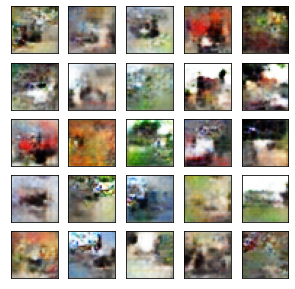

Epoch[99/300],d_loss:1.008863,g_loss:1.288549 D real: 0.658211,D fake: 0.288383
Epoch[99/300],d_loss:0.825245,g_loss:1.213580 D real: 0.670494,D fake: 0.306817
Epoch[99/300],d_loss:0.943188,g_loss:1.058772 D real: 0.616647,D fake: 0.364667
Epoch[99/300],d_loss:0.730678,g_loss:1.215212 D real: 0.680928,D fake: 0.308576


 33%|███▎      | 100/300 [24:18<50:27, 15.14s/it]

Epoch[100/300],d_loss:1.191080,g_loss:0.978361 D real: 0.606845,D fake: 0.390551
Epoch[100/300],d_loss:0.864904,g_loss:0.991676 D real: 0.611548,D fake: 0.384950
Epoch[100/300],d_loss:0.964777,g_loss:0.930087 D real: 0.601599,D fake: 0.410001
Epoch[100/300],d_loss:0.774239,g_loss:1.122805 D real: 0.662567,D fake: 0.334353


 34%|███▎      | 101/300 [24:31<48:02, 14.49s/it]

Epoch[101/300],d_loss:1.044702,g_loss:1.087556 D real: 0.610622,D fake: 0.352515
Epoch[101/300],d_loss:0.898961,g_loss:1.099567 D real: 0.676587,D fake: 0.345111
Epoch[101/300],d_loss:0.816475,g_loss:1.060229 D real: 0.637405,D fake: 0.358501
Epoch[101/300],d_loss:1.004869,g_loss:0.943857 D real: 0.572696,D fake: 0.403406


 34%|███▍      | 102/300 [24:44<46:36, 14.12s/it]

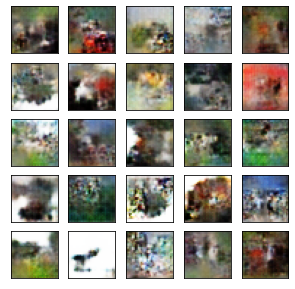

Epoch[102/300],d_loss:0.984437,g_loss:1.261239 D real: 0.709645,D fake: 0.292252
Epoch[102/300],d_loss:1.125356,g_loss:1.075247 D real: 0.641583,D fake: 0.349341
Epoch[102/300],d_loss:0.743411,g_loss:1.308174 D real: 0.707181,D fake: 0.277718
Epoch[102/300],d_loss:0.858568,g_loss:1.091662 D real: 0.668471,D fake: 0.349394


 34%|███▍      | 103/300 [25:00<48:25, 14.75s/it]

Epoch[103/300],d_loss:0.988553,g_loss:1.303719 D real: 0.687115,D fake: 0.307811
Epoch[103/300],d_loss:0.748640,g_loss:1.248713 D real: 0.670907,D fake: 0.299633
Epoch[103/300],d_loss:0.871623,g_loss:1.065497 D real: 0.628720,D fake: 0.356269
Epoch[103/300],d_loss:0.814327,g_loss:1.063160 D real: 0.672019,D fake: 0.354541


 35%|███▍      | 104/300 [25:14<47:26, 14.53s/it]

Epoch[104/300],d_loss:1.047084,g_loss:1.158250 D real: 0.632382,D fake: 0.326257
Epoch[104/300],d_loss:0.783205,g_loss:1.312506 D real: 0.716578,D fake: 0.280541
Epoch[104/300],d_loss:0.904039,g_loss:1.188912 D real: 0.640105,D fake: 0.314337
Epoch[104/300],d_loss:0.904493,g_loss:1.069734 D real: 0.698560,D fake: 0.359265


 35%|███▌      | 105/300 [25:28<46:55, 14.44s/it]

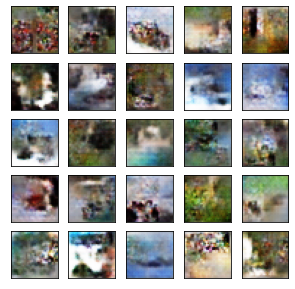

Epoch[105/300],d_loss:0.975091,g_loss:1.457419 D real: 0.717172,D fake: 0.246672
Epoch[105/300],d_loss:0.910599,g_loss:1.080580 D real: 0.639481,D fake: 0.350700
Epoch[105/300],d_loss:0.870903,g_loss:1.075922 D real: 0.591300,D fake: 0.350841
Epoch[105/300],d_loss:0.859877,g_loss:1.191988 D real: 0.675352,D fake: 0.315816


 35%|███▌      | 106/300 [25:44<47:47, 14.78s/it]

Epoch[106/300],d_loss:0.987956,g_loss:1.220360 D real: 0.664026,D fake: 0.305287
Epoch[106/300],d_loss:0.939997,g_loss:0.952888 D real: 0.599805,D fake: 0.396215
Epoch[106/300],d_loss:0.841183,g_loss:1.069947 D real: 0.647618,D fake: 0.353335
Epoch[106/300],d_loss:0.885222,g_loss:0.954001 D real: 0.623407,D fake: 0.397772


 36%|███▌      | 107/300 [25:57<46:24, 14.43s/it]

Epoch[107/300],d_loss:0.987152,g_loss:1.553042 D real: 0.742728,D fake: 0.226069
Epoch[107/300],d_loss:0.907863,g_loss:1.150783 D real: 0.672132,D fake: 0.329423
Epoch[107/300],d_loss:0.857940,g_loss:1.015440 D real: 0.623410,D fake: 0.373915
Epoch[107/300],d_loss:0.728297,g_loss:1.247240 D real: 0.707255,D fake: 0.297395


 36%|███▌      | 108/300 [26:12<46:09, 14.42s/it]

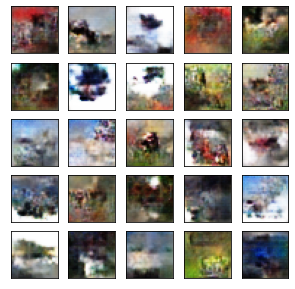

Epoch[108/300],d_loss:0.885313,g_loss:1.392051 D real: 0.763872,D fake: 0.259308
Epoch[108/300],d_loss:0.819347,g_loss:1.288157 D real: 0.718580,D fake: 0.286020
Epoch[108/300],d_loss:0.830094,g_loss:1.224392 D real: 0.680277,D fake: 0.310953
Epoch[108/300],d_loss:0.880160,g_loss:1.228005 D real: 0.704099,D fake: 0.304163


 36%|███▋      | 109/300 [26:28<48:01, 15.09s/it]

Epoch[109/300],d_loss:0.879413,g_loss:1.513209 D real: 0.720309,D fake: 0.229049
Epoch[109/300],d_loss:0.774320,g_loss:1.148151 D real: 0.676502,D fake: 0.326018
Epoch[109/300],d_loss:0.858680,g_loss:1.028663 D real: 0.613663,D fake: 0.363155
Epoch[109/300],d_loss:0.886377,g_loss:1.102589 D real: 0.684237,D fake: 0.342113


 37%|███▋      | 110/300 [26:43<47:10, 14.90s/it]

Epoch[110/300],d_loss:1.126822,g_loss:1.351532 D real: 0.656390,D fake: 0.265341
Epoch[110/300],d_loss:0.791018,g_loss:1.238026 D real: 0.653600,D fake: 0.302148
Epoch[110/300],d_loss:0.871936,g_loss:1.169021 D real: 0.683301,D fake: 0.322384
Epoch[110/300],d_loss:0.792318,g_loss:1.186982 D real: 0.654672,D fake: 0.313351


 37%|███▋      | 111/300 [26:57<46:24, 14.73s/it]

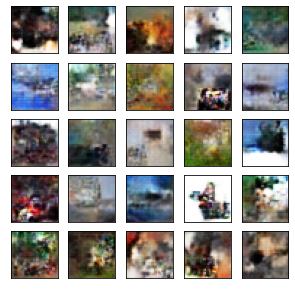

Epoch[111/300],d_loss:0.971834,g_loss:1.166806 D real: 0.685854,D fake: 0.318557
Epoch[111/300],d_loss:0.893726,g_loss:0.905754 D real: 0.618880,D fake: 0.411305
Epoch[111/300],d_loss:0.967543,g_loss:1.273231 D real: 0.689167,D fake: 0.292731
Epoch[111/300],d_loss:0.814580,g_loss:1.284514 D real: 0.722157,D fake: 0.293352


 37%|███▋      | 112/300 [27:12<46:00, 14.68s/it]

Epoch[112/300],d_loss:0.793204,g_loss:1.333153 D real: 0.692095,D fake: 0.276458
Epoch[112/300],d_loss:0.900202,g_loss:1.160200 D real: 0.664743,D fake: 0.327906
Epoch[112/300],d_loss:0.888901,g_loss:0.931927 D real: 0.615683,D fake: 0.405261
Epoch[112/300],d_loss:0.992361,g_loss:0.953811 D real: 0.580331,D fake: 0.408552


 38%|███▊      | 113/300 [27:24<43:25, 13.93s/it]

Epoch[113/300],d_loss:0.955506,g_loss:1.164751 D real: 0.673713,D fake: 0.321199
Epoch[113/300],d_loss:0.876713,g_loss:1.260089 D real: 0.671214,D fake: 0.293341
Epoch[113/300],d_loss:0.819336,g_loss:1.143638 D real: 0.655716,D fake: 0.325015
Epoch[113/300],d_loss:0.949813,g_loss:0.949566 D real: 0.611318,D fake: 0.394392


 38%|███▊      | 114/300 [27:38<42:45, 13.79s/it]

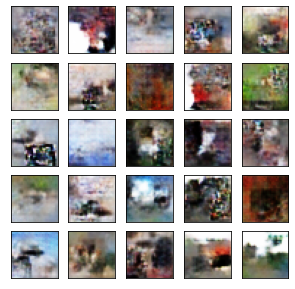

Epoch[114/300],d_loss:1.089535,g_loss:1.228512 D real: 0.675573,D fake: 0.302889
Epoch[114/300],d_loss:1.070409,g_loss:1.029925 D real: 0.651090,D fake: 0.364970
Epoch[114/300],d_loss:0.986853,g_loss:0.987798 D real: 0.594453,D fake: 0.383654
Epoch[114/300],d_loss:0.958701,g_loss:0.948610 D real: 0.575214,D fake: 0.394774


 38%|███▊      | 115/300 [27:53<44:00, 14.27s/it]

Epoch[115/300],d_loss:1.116635,g_loss:1.199900 D real: 0.678261,D fake: 0.310859
Epoch[115/300],d_loss:0.968041,g_loss:1.009808 D real: 0.648614,D fake: 0.373533
Epoch[115/300],d_loss:0.954114,g_loss:1.248320 D real: 0.696788,D fake: 0.295976
Epoch[115/300],d_loss:0.931991,g_loss:1.010921 D real: 0.621695,D fake: 0.374952


 39%|███▊      | 116/300 [28:06<42:37, 13.90s/it]

Epoch[116/300],d_loss:1.080249,g_loss:1.214364 D real: 0.674236,D fake: 0.306328
Epoch[116/300],d_loss:0.918716,g_loss:1.001648 D real: 0.628374,D fake: 0.375717
Epoch[116/300],d_loss:1.032480,g_loss:0.910637 D real: 0.594550,D fake: 0.410181
Epoch[116/300],d_loss:1.066884,g_loss:0.901224 D real: 0.545820,D fake: 0.415787


 39%|███▉      | 117/300 [28:19<41:50, 13.72s/it]

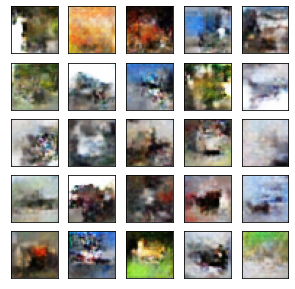

Epoch[117/300],d_loss:1.083064,g_loss:1.068094 D real: 0.559253,D fake: 0.360070
Epoch[117/300],d_loss:0.853841,g_loss:0.968157 D real: 0.606358,D fake: 0.390032
Epoch[117/300],d_loss:1.018291,g_loss:0.886983 D real: 0.558289,D fake: 0.424548
Epoch[117/300],d_loss:0.877359,g_loss:0.870841 D real: 0.614782,D fake: 0.425915


 39%|███▉      | 118/300 [28:35<43:32, 14.35s/it]

Epoch[118/300],d_loss:1.049014,g_loss:1.164840 D real: 0.663984,D fake: 0.318824
Epoch[118/300],d_loss:0.980393,g_loss:0.823873 D real: 0.555937,D fake: 0.445830
Epoch[118/300],d_loss:0.935247,g_loss:0.925384 D real: 0.605965,D fake: 0.404143
Epoch[118/300],d_loss:0.976153,g_loss:1.100915 D real: 0.666352,D fake: 0.342356


 40%|███▉      | 119/300 [28:49<43:10, 14.31s/it]

Epoch[119/300],d_loss:1.210635,g_loss:1.263650 D real: 0.643185,D fake: 0.299255
Epoch[119/300],d_loss:0.978610,g_loss:1.090984 D real: 0.611182,D fake: 0.347273
Epoch[119/300],d_loss:0.899351,g_loss:1.229920 D real: 0.695664,D fake: 0.300672
Epoch[119/300],d_loss:0.941741,g_loss:1.042713 D real: 0.583938,D fake: 0.370423


 40%|████      | 120/300 [29:04<43:24, 14.47s/it]

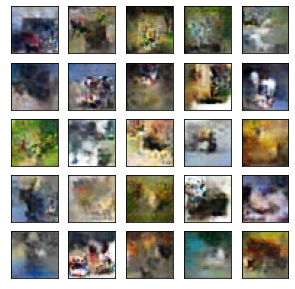

Epoch[120/300],d_loss:1.040161,g_loss:1.423657 D real: 0.726626,D fake: 0.252217
Epoch[120/300],d_loss:0.783482,g_loss:1.206032 D real: 0.641861,D fake: 0.310668
Epoch[120/300],d_loss:0.964910,g_loss:0.979083 D real: 0.629777,D fake: 0.389241
Epoch[120/300],d_loss:0.998905,g_loss:0.968070 D real: 0.565141,D fake: 0.389364


 40%|████      | 121/300 [29:21<45:08, 15.13s/it]

Epoch[121/300],d_loss:1.275670,g_loss:1.468719 D real: 0.710599,D fake: 0.247563
Epoch[121/300],d_loss:1.057985,g_loss:0.931500 D real: 0.600187,D fake: 0.405989
Epoch[121/300],d_loss:0.820375,g_loss:1.319994 D real: 0.710281,D fake: 0.278488
Epoch[121/300],d_loss:0.895005,g_loss:1.072423 D real: 0.709166,D fake: 0.352434


 41%|████      | 122/300 [29:34<43:23, 14.63s/it]

Epoch[122/300],d_loss:1.150153,g_loss:1.019135 D real: 0.565403,D fake: 0.370099
Epoch[122/300],d_loss:0.855623,g_loss:1.157154 D real: 0.684090,D fake: 0.326762
Epoch[122/300],d_loss:0.869669,g_loss:1.064451 D real: 0.655864,D fake: 0.355165
Epoch[122/300],d_loss:0.923794,g_loss:1.107737 D real: 0.653772,D fake: 0.341380


 41%|████      | 123/300 [29:49<43:15, 14.66s/it]

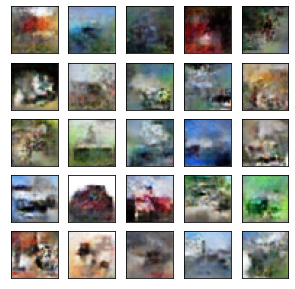

Epoch[123/300],d_loss:1.078401,g_loss:1.186461 D real: 0.677105,D fake: 0.314866
Epoch[123/300],d_loss:0.961018,g_loss:1.100421 D real: 0.642187,D fake: 0.343203
Epoch[123/300],d_loss:0.822359,g_loss:1.248968 D real: 0.659545,D fake: 0.294842
Epoch[123/300],d_loss:0.940114,g_loss:1.090668 D real: 0.656361,D fake: 0.346429


 41%|████▏     | 124/300 [30:05<44:27, 15.16s/it]

Epoch[124/300],d_loss:1.096107,g_loss:1.193031 D real: 0.703500,D fake: 0.315857
Epoch[124/300],d_loss:0.873211,g_loss:1.033599 D real: 0.617237,D fake: 0.372762
Epoch[124/300],d_loss:0.856909,g_loss:1.157590 D real: 0.626899,D fake: 0.332344
Epoch[124/300],d_loss:1.067136,g_loss:1.080999 D real: 0.646377,D fake: 0.353678


 42%|████▏     | 125/300 [30:19<43:03, 14.76s/it]

Epoch[125/300],d_loss:1.057736,g_loss:0.902465 D real: 0.572504,D fake: 0.421044
Epoch[125/300],d_loss:0.910707,g_loss:1.107603 D real: 0.645925,D fake: 0.339702
Epoch[125/300],d_loss:1.070868,g_loss:0.934480 D real: 0.587725,D fake: 0.399346
Epoch[125/300],d_loss:0.837413,g_loss:1.258982 D real: 0.695824,D fake: 0.296312


 42%|████▏     | 126/300 [30:34<42:45, 14.75s/it]

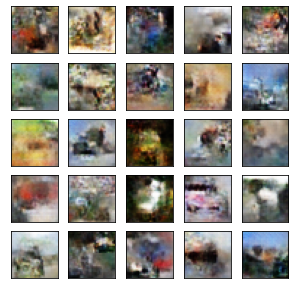

Epoch[126/300],d_loss:0.981343,g_loss:1.118390 D real: 0.638257,D fake: 0.337421
Epoch[126/300],d_loss:0.972360,g_loss:1.142762 D real: 0.680614,D fake: 0.332555
Epoch[126/300],d_loss:1.012310,g_loss:0.913861 D real: 0.553109,D fake: 0.410123
Epoch[126/300],d_loss:0.958380,g_loss:1.019937 D real: 0.665580,D fake: 0.370785


 42%|████▏     | 127/300 [30:48<41:43, 14.47s/it]

Epoch[127/300],d_loss:1.019007,g_loss:1.233816 D real: 0.670991,D fake: 0.298817
Epoch[127/300],d_loss:1.085112,g_loss:0.918637 D real: 0.620062,D fake: 0.407394
Epoch[127/300],d_loss:0.941180,g_loss:1.017701 D real: 0.639851,D fake: 0.370040
Epoch[127/300],d_loss:0.935170,g_loss:1.162897 D real: 0.670955,D fake: 0.320734


 43%|████▎     | 128/300 [31:01<40:17, 14.05s/it]

Epoch[128/300],d_loss:1.212527,g_loss:1.149824 D real: 0.579344,D fake: 0.332546
Epoch[128/300],d_loss:1.036610,g_loss:0.931101 D real: 0.616971,D fake: 0.401404
Epoch[128/300],d_loss:0.966050,g_loss:1.064358 D real: 0.629877,D fake: 0.352018
Epoch[128/300],d_loss:0.970741,g_loss:1.042559 D real: 0.691271,D fake: 0.362744


 43%|████▎     | 129/300 [31:14<39:31, 13.87s/it]

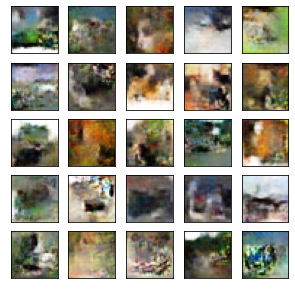

Epoch[129/300],d_loss:1.063781,g_loss:1.025647 D real: 0.599179,D fake: 0.369424
Epoch[129/300],d_loss:1.013723,g_loss:0.972231 D real: 0.610870,D fake: 0.389606
Epoch[129/300],d_loss:1.012078,g_loss:0.942264 D real: 0.644852,D fake: 0.397212
Epoch[129/300],d_loss:1.046678,g_loss:0.939306 D real: 0.563562,D fake: 0.405068


 43%|████▎     | 130/300 [31:31<41:53, 14.78s/it]

Epoch[130/300],d_loss:1.205569,g_loss:0.952043 D real: 0.598508,D fake: 0.394561
Epoch[130/300],d_loss:0.966425,g_loss:1.007750 D real: 0.610332,D fake: 0.381837
Epoch[130/300],d_loss:1.003323,g_loss:1.012785 D real: 0.650502,D fake: 0.374292
Epoch[130/300],d_loss:1.043271,g_loss:0.902344 D real: 0.576195,D fake: 0.412031


 44%|████▎     | 131/300 [31:46<41:50, 14.85s/it]

Epoch[131/300],d_loss:1.010460,g_loss:1.294336 D real: 0.692650,D fake: 0.284073
Epoch[131/300],d_loss:0.949357,g_loss:1.035891 D real: 0.613409,D fake: 0.365119
Epoch[131/300],d_loss:1.076057,g_loss:0.883024 D real: 0.587932,D fake: 0.428760
Epoch[131/300],d_loss:0.907210,g_loss:1.270392 D real: 0.706318,D fake: 0.291945


 44%|████▍     | 132/300 [32:00<40:52, 14.60s/it]

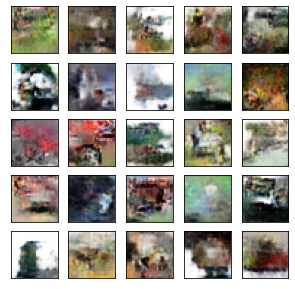

Epoch[132/300],d_loss:1.131288,g_loss:1.025700 D real: 0.649693,D fake: 0.376341
Epoch[132/300],d_loss:1.031413,g_loss:1.213861 D real: 0.723719,D fake: 0.305077
Epoch[132/300],d_loss:0.993895,g_loss:1.101439 D real: 0.634935,D fake: 0.341281
Epoch[132/300],d_loss:1.118273,g_loss:0.883309 D real: 0.549126,D fake: 0.423828


 44%|████▍     | 133/300 [32:15<40:48, 14.66s/it]

Epoch[133/300],d_loss:1.218933,g_loss:1.088070 D real: 0.561342,D fake: 0.354647
Epoch[133/300],d_loss:0.925501,g_loss:1.139490 D real: 0.691674,D fake: 0.330825
Epoch[133/300],d_loss:1.067212,g_loss:1.011089 D real: 0.634298,D fake: 0.376698
Epoch[133/300],d_loss:1.151462,g_loss:0.916210 D real: 0.603735,D fake: 0.410471


 45%|████▍     | 134/300 [32:30<40:44, 14.73s/it]

Epoch[134/300],d_loss:1.096226,g_loss:1.036477 D real: 0.587264,D fake: 0.362994
Epoch[134/300],d_loss:1.034899,g_loss:1.025359 D real: 0.611409,D fake: 0.371665
Epoch[134/300],d_loss:0.950891,g_loss:1.038592 D real: 0.634973,D fake: 0.366209
Epoch[134/300],d_loss:0.911034,g_loss:1.152443 D real: 0.687459,D fake: 0.337842


 45%|████▌     | 135/300 [32:44<39:45, 14.45s/it]

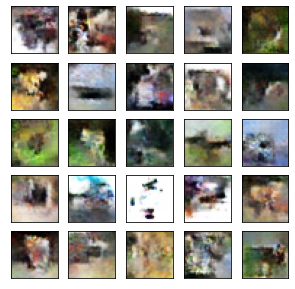

Epoch[135/300],d_loss:1.236293,g_loss:1.027196 D real: 0.619892,D fake: 0.367919
Epoch[135/300],d_loss:0.979149,g_loss:1.039043 D real: 0.641201,D fake: 0.366076
Epoch[135/300],d_loss:1.010702,g_loss:1.191905 D real: 0.677461,D fake: 0.313302
Epoch[135/300],d_loss:0.930827,g_loss:0.944839 D real: 0.644336,D fake: 0.407285


 45%|████▌     | 136/300 [32:59<40:25, 14.79s/it]

Epoch[136/300],d_loss:1.011082,g_loss:1.125293 D real: 0.618945,D fake: 0.336739
Epoch[136/300],d_loss:1.082477,g_loss:1.101593 D real: 0.626823,D fake: 0.339909
Epoch[136/300],d_loss:0.912660,g_loss:1.119788 D real: 0.644336,D fake: 0.340414
Epoch[136/300],d_loss:1.118410,g_loss:0.868444 D real: 0.549796,D fake: 0.433550


 46%|████▌     | 137/300 [33:14<40:29, 14.91s/it]

Epoch[137/300],d_loss:1.084573,g_loss:1.403613 D real: 0.706194,D fake: 0.258762
Epoch[137/300],d_loss:0.945773,g_loss:1.044493 D real: 0.611970,D fake: 0.365601
Epoch[137/300],d_loss:1.093734,g_loss:1.069237 D real: 0.645003,D fake: 0.352299
Epoch[137/300],d_loss:0.981626,g_loss:1.013262 D real: 0.663251,D fake: 0.370059


 46%|████▌     | 138/300 [33:29<39:52, 14.77s/it]

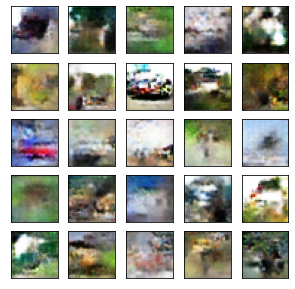

Epoch[138/300],d_loss:1.209699,g_loss:1.027800 D real: 0.591973,D fake: 0.365362
Epoch[138/300],d_loss:0.986778,g_loss:0.993684 D real: 0.605599,D fake: 0.384321
Epoch[138/300],d_loss:0.855908,g_loss:1.180038 D real: 0.671756,D fake: 0.317993
Epoch[138/300],d_loss:0.945339,g_loss:1.122030 D real: 0.622158,D fake: 0.333951


 46%|████▋     | 139/300 [33:45<40:57, 15.26s/it]

Epoch[139/300],d_loss:1.023424,g_loss:1.205462 D real: 0.642088,D fake: 0.310759
Epoch[139/300],d_loss:1.114756,g_loss:0.782521 D real: 0.549137,D fake: 0.462687
Epoch[139/300],d_loss:1.012044,g_loss:1.037871 D real: 0.665493,D fake: 0.366175
Epoch[139/300],d_loss:1.012091,g_loss:0.972285 D real: 0.651446,D fake: 0.389039


 47%|████▋     | 140/300 [34:01<40:41, 15.26s/it]

Epoch[140/300],d_loss:1.143230,g_loss:1.301303 D real: 0.675370,D fake: 0.291830
Epoch[140/300],d_loss:0.956434,g_loss:1.060998 D real: 0.644998,D fake: 0.357521
Epoch[140/300],d_loss:1.068579,g_loss:1.016420 D real: 0.609151,D fake: 0.370039
Epoch[140/300],d_loss:0.930908,g_loss:1.195753 D real: 0.636900,D fake: 0.313452


 47%|████▋     | 141/300 [34:14<38:42, 14.61s/it]

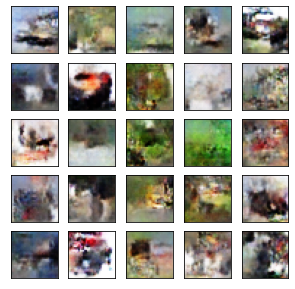

Epoch[141/300],d_loss:1.131262,g_loss:1.049582 D real: 0.609913,D fake: 0.358902
Epoch[141/300],d_loss:1.020875,g_loss:1.065674 D real: 0.622185,D fake: 0.355873
Epoch[141/300],d_loss:0.875795,g_loss:1.123902 D real: 0.662786,D fake: 0.337077
Epoch[141/300],d_loss:1.070215,g_loss:0.874092 D real: 0.552861,D fake: 0.426224


 47%|████▋     | 142/300 [34:30<39:58, 15.18s/it]

Epoch[142/300],d_loss:1.228852,g_loss:0.943118 D real: 0.618382,D fake: 0.400912
Epoch[142/300],d_loss:0.876557,g_loss:0.916742 D real: 0.616653,D fake: 0.405952
Epoch[142/300],d_loss:0.944424,g_loss:0.979008 D real: 0.583378,D fake: 0.384243
Epoch[142/300],d_loss:1.014328,g_loss:0.974643 D real: 0.598180,D fake: 0.401976


 48%|████▊     | 143/300 [34:44<38:56, 14.88s/it]

Epoch[143/300],d_loss:1.240905,g_loss:1.309212 D real: 0.697566,D fake: 0.280494
Epoch[143/300],d_loss:0.852791,g_loss:1.119858 D real: 0.674661,D fake: 0.339655
Epoch[143/300],d_loss:0.976452,g_loss:1.042031 D real: 0.620941,D fake: 0.365747
Epoch[143/300],d_loss:1.169625,g_loss:0.773068 D real: 0.482960,D fake: 0.471242


 48%|████▊     | 144/300 [34:59<38:20, 14.75s/it]

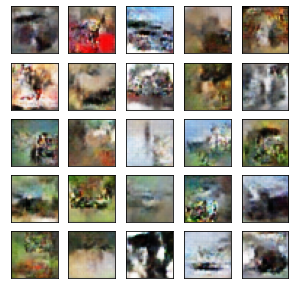

Epoch[144/300],d_loss:1.272913,g_loss:1.129692 D real: 0.654913,D fake: 0.342830
Epoch[144/300],d_loss:1.025347,g_loss:1.001386 D real: 0.626243,D fake: 0.384183
Epoch[144/300],d_loss:1.027722,g_loss:0.939638 D real: 0.572409,D fake: 0.401834
Epoch[144/300],d_loss:0.982675,g_loss:1.045591 D real: 0.590992,D fake: 0.359124


 48%|████▊     | 145/300 [35:15<39:00, 15.10s/it]

Epoch[145/300],d_loss:1.270317,g_loss:1.009575 D real: 0.599199,D fake: 0.370616
Epoch[145/300],d_loss:1.001495,g_loss:0.925989 D real: 0.608341,D fake: 0.402852
Epoch[145/300],d_loss:1.037492,g_loss:0.951243 D real: 0.628105,D fake: 0.392641
Epoch[145/300],d_loss:0.902547,g_loss:1.068194 D real: 0.656926,D fake: 0.351075


 49%|████▊     | 146/300 [35:28<37:38, 14.67s/it]

Epoch[146/300],d_loss:1.161665,g_loss:1.056814 D real: 0.652069,D fake: 0.358045
Epoch[146/300],d_loss:1.082568,g_loss:1.244964 D real: 0.692387,D fake: 0.301821
Epoch[146/300],d_loss:1.012156,g_loss:1.038989 D real: 0.663002,D fake: 0.362612
Epoch[146/300],d_loss:1.052671,g_loss:1.006814 D real: 0.569990,D fake: 0.372717


 49%|████▉     | 147/300 [35:41<35:37, 13.97s/it]

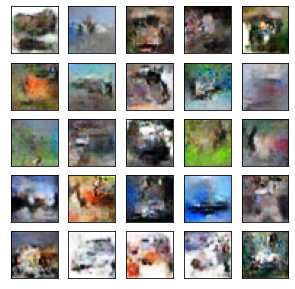

Epoch[147/300],d_loss:1.147581,g_loss:1.083045 D real: 0.615289,D fake: 0.345499
Epoch[147/300],d_loss:1.120321,g_loss:0.879346 D real: 0.566327,D fake: 0.421417
Epoch[147/300],d_loss:1.115138,g_loss:0.909508 D real: 0.588219,D fake: 0.411777
Epoch[147/300],d_loss:1.022320,g_loss:0.975630 D real: 0.633710,D fake: 0.397639


 49%|████▉     | 148/300 [35:56<36:03, 14.24s/it]

Epoch[148/300],d_loss:1.034166,g_loss:1.361007 D real: 0.693103,D fake: 0.261548
Epoch[148/300],d_loss:1.042879,g_loss:1.039502 D real: 0.604731,D fake: 0.361219
Epoch[148/300],d_loss:1.038115,g_loss:0.850823 D real: 0.573121,D fake: 0.436576
Epoch[148/300],d_loss:1.122971,g_loss:0.894952 D real: 0.569877,D fake: 0.421483


 50%|████▉     | 149/300 [36:08<34:43, 13.80s/it]

Epoch[149/300],d_loss:1.218408,g_loss:0.956369 D real: 0.593133,D fake: 0.398718
Epoch[149/300],d_loss:0.992723,g_loss:0.926330 D real: 0.573492,D fake: 0.412199
Epoch[149/300],d_loss:1.013688,g_loss:1.220761 D real: 0.701462,D fake: 0.303464
Epoch[149/300],d_loss:1.002864,g_loss:0.921246 D real: 0.575747,D fake: 0.406410


 50%|█████     | 150/300 [36:21<34:03, 13.62s/it]

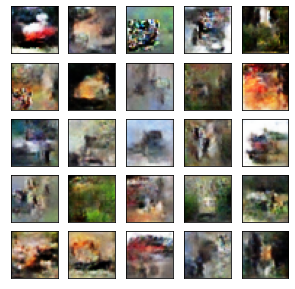

Epoch[150/300],d_loss:1.217334,g_loss:1.019681 D real: 0.611011,D fake: 0.369609
Epoch[150/300],d_loss:1.131144,g_loss:0.889994 D real: 0.605910,D fake: 0.421837
Epoch[150/300],d_loss:1.011982,g_loss:1.232562 D real: 0.636743,D fake: 0.301221
Epoch[150/300],d_loss:0.977729,g_loss:1.103627 D real: 0.663021,D fake: 0.354013


 50%|█████     | 151/300 [36:37<35:22, 14.25s/it]

Epoch[151/300],d_loss:1.079298,g_loss:1.002749 D real: 0.581127,D fake: 0.374129
Epoch[151/300],d_loss:1.087882,g_loss:0.813346 D real: 0.568792,D fake: 0.450220
Epoch[151/300],d_loss:0.977398,g_loss:0.987458 D real: 0.589724,D fake: 0.381764
Epoch[151/300],d_loss:0.993226,g_loss:1.021626 D real: 0.631158,D fake: 0.369268


 51%|█████     | 152/300 [36:51<34:51, 14.13s/it]

Epoch[152/300],d_loss:1.020939,g_loss:1.261858 D real: 0.632932,D fake: 0.290633
Epoch[152/300],d_loss:1.081142,g_loss:1.080410 D real: 0.591746,D fake: 0.354974
Epoch[152/300],d_loss:0.997528,g_loss:0.999749 D real: 0.636980,D fake: 0.382354
Epoch[152/300],d_loss:1.064165,g_loss:1.058616 D real: 0.631052,D fake: 0.360319


 51%|█████     | 153/300 [37:06<34:54, 14.25s/it]

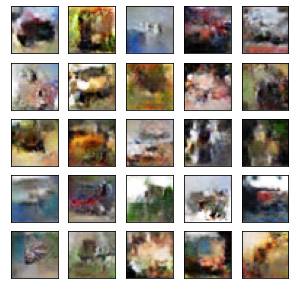

Epoch[153/300],d_loss:1.211070,g_loss:0.940705 D real: 0.573207,D fake: 0.402248
Epoch[153/300],d_loss:1.018792,g_loss:1.057106 D real: 0.618972,D fake: 0.361062
Epoch[153/300],d_loss:1.119676,g_loss:0.946233 D real: 0.616631,D fake: 0.398166
Epoch[153/300],d_loss:1.048413,g_loss:0.877360 D real: 0.611882,D fake: 0.431920


 51%|█████▏    | 154/300 [37:22<35:54, 14.76s/it]

Epoch[154/300],d_loss:1.064219,g_loss:0.907216 D real: 0.592474,D fake: 0.417458
Epoch[154/300],d_loss:1.068752,g_loss:1.017608 D real: 0.644497,D fake: 0.368579
Epoch[154/300],d_loss:0.989355,g_loss:0.769613 D real: 0.543176,D fake: 0.470234
Epoch[154/300],d_loss:1.185829,g_loss:0.786518 D real: 0.532177,D fake: 0.462950


 52%|█████▏    | 155/300 [37:36<35:35, 14.73s/it]

Epoch[155/300],d_loss:1.015781,g_loss:1.145157 D real: 0.645152,D fake: 0.323323
Epoch[155/300],d_loss:1.140272,g_loss:0.840330 D real: 0.531440,D fake: 0.438417
Epoch[155/300],d_loss:1.064167,g_loss:0.794441 D real: 0.549365,D fake: 0.460530
Epoch[155/300],d_loss:1.055481,g_loss:1.013299 D real: 0.662422,D fake: 0.369720


 52%|█████▏    | 156/300 [37:49<33:43, 14.05s/it]

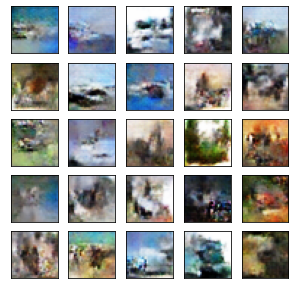

Epoch[156/300],d_loss:1.121992,g_loss:1.439918 D real: 0.680092,D fake: 0.250775
Epoch[156/300],d_loss:1.141846,g_loss:0.891264 D real: 0.562072,D fake: 0.420543
Epoch[156/300],d_loss:1.170954,g_loss:0.753523 D real: 0.541423,D fake: 0.477527
Epoch[156/300],d_loss:1.002299,g_loss:1.054643 D real: 0.632257,D fake: 0.354623


 52%|█████▏    | 157/300 [38:05<35:27, 14.88s/it]

Epoch[157/300],d_loss:1.161543,g_loss:1.307002 D real: 0.625526,D fake: 0.283396
Epoch[157/300],d_loss:1.015640,g_loss:0.994445 D real: 0.639761,D fake: 0.380185
Epoch[157/300],d_loss:0.994197,g_loss:1.052171 D real: 0.620021,D fake: 0.364316
Epoch[157/300],d_loss:1.139500,g_loss:0.850342 D real: 0.538514,D fake: 0.436487


 53%|█████▎    | 158/300 [38:20<34:52, 14.73s/it]

Epoch[158/300],d_loss:1.098235,g_loss:1.110203 D real: 0.629903,D fake: 0.340163
Epoch[158/300],d_loss:1.056832,g_loss:0.859564 D real: 0.577917,D fake: 0.431388
Epoch[158/300],d_loss:1.002625,g_loss:0.904415 D real: 0.558045,D fake: 0.412418
Epoch[158/300],d_loss:0.911615,g_loss:1.090822 D real: 0.613124,D fake: 0.347480


 53%|█████▎    | 159/300 [38:35<34:42, 14.77s/it]

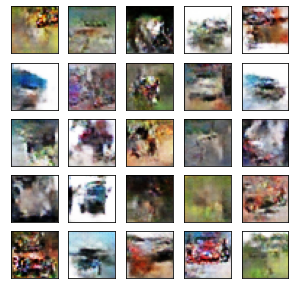

Epoch[159/300],d_loss:1.166729,g_loss:1.113230 D real: 0.630874,D fake: 0.339624
Epoch[159/300],d_loss:0.882743,g_loss:1.015965 D real: 0.628444,D fake: 0.373522
Epoch[159/300],d_loss:1.151865,g_loss:0.705006 D real: 0.487909,D fake: 0.498209
Epoch[159/300],d_loss:1.107613,g_loss:0.881942 D real: 0.538048,D fake: 0.422994


 53%|█████▎    | 160/300 [38:51<35:46, 15.33s/it]

Epoch[160/300],d_loss:1.126588,g_loss:1.109077 D real: 0.665085,D fake: 0.342355
Epoch[160/300],d_loss:1.053823,g_loss:0.819437 D real: 0.559162,D fake: 0.450588
Epoch[160/300],d_loss:1.227791,g_loss:0.727996 D real: 0.509165,D fake: 0.491353
Epoch[160/300],d_loss:0.974111,g_loss:1.010516 D real: 0.644043,D fake: 0.373752


 54%|█████▎    | 161/300 [39:06<34:54, 15.07s/it]

Epoch[161/300],d_loss:1.300877,g_loss:1.175135 D real: 0.695648,D fake: 0.315833
Epoch[161/300],d_loss:1.118689,g_loss:0.845462 D real: 0.585998,D fake: 0.439023
Epoch[161/300],d_loss:0.984091,g_loss:1.145547 D real: 0.668122,D fake: 0.328418
Epoch[161/300],d_loss:1.089660,g_loss:1.142727 D real: 0.680107,D fake: 0.326982


 54%|█████▍    | 162/300 [39:19<33:33, 14.59s/it]

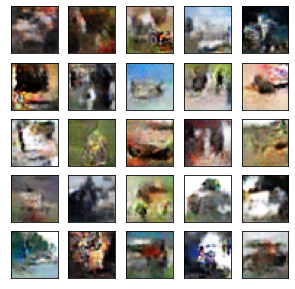

Epoch[162/300],d_loss:1.239795,g_loss:0.944531 D real: 0.578308,D fake: 0.395061
Epoch[162/300],d_loss:1.199328,g_loss:0.884507 D real: 0.538367,D fake: 0.420664
Epoch[162/300],d_loss:1.125541,g_loss:0.733832 D real: 0.516497,D fake: 0.489543
Epoch[162/300],d_loss:1.009498,g_loss:1.054042 D real: 0.669539,D fake: 0.355737


 54%|█████▍    | 163/300 [39:36<34:55, 15.30s/it]

Epoch[163/300],d_loss:1.035890,g_loss:1.212866 D real: 0.630121,D fake: 0.310738
Epoch[163/300],d_loss:1.108338,g_loss:0.913655 D real: 0.558324,D fake: 0.409367
Epoch[163/300],d_loss:1.270638,g_loss:0.748886 D real: 0.494761,D fake: 0.481803
Epoch[163/300],d_loss:1.177070,g_loss:0.823367 D real: 0.550277,D fake: 0.447031


 55%|█████▍    | 164/300 [39:50<33:38, 14.84s/it]

Epoch[164/300],d_loss:1.174213,g_loss:1.058122 D real: 0.594878,D fake: 0.359245
Epoch[164/300],d_loss:0.996303,g_loss:1.088110 D real: 0.642096,D fake: 0.359685
Epoch[164/300],d_loss:1.009290,g_loss:0.887052 D real: 0.571799,D fake: 0.423156
Epoch[164/300],d_loss:1.128160,g_loss:0.854604 D real: 0.577959,D fake: 0.433519


 55%|█████▌    | 165/300 [40:02<31:26, 13.98s/it]

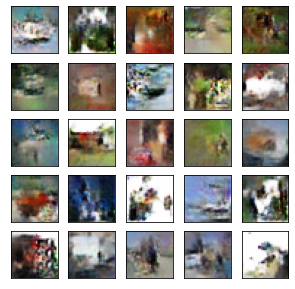

Epoch[165/300],d_loss:1.323203,g_loss:0.944519 D real: 0.627908,D fake: 0.398010
Epoch[165/300],d_loss:1.024304,g_loss:0.968130 D real: 0.591689,D fake: 0.390040
Epoch[165/300],d_loss:0.991300,g_loss:1.033924 D real: 0.658231,D fake: 0.364953
Epoch[165/300],d_loss:1.178823,g_loss:0.828628 D real: 0.550848,D fake: 0.447058


 55%|█████▌    | 166/300 [40:16<31:19, 14.03s/it]

Epoch[166/300],d_loss:1.219885,g_loss:1.040842 D real: 0.627378,D fake: 0.364522
Epoch[166/300],d_loss:1.082670,g_loss:0.861902 D real: 0.607553,D fake: 0.430780
Epoch[166/300],d_loss:1.160005,g_loss:0.718369 D real: 0.536125,D fake: 0.495243
Epoch[166/300],d_loss:1.111729,g_loss:0.901767 D real: 0.558871,D fake: 0.413764


 56%|█████▌    | 167/300 [40:31<31:25, 14.18s/it]

Epoch[167/300],d_loss:1.095641,g_loss:1.343743 D real: 0.677452,D fake: 0.272753
Epoch[167/300],d_loss:1.101946,g_loss:1.029283 D real: 0.647560,D fake: 0.369096
Epoch[167/300],d_loss:1.069426,g_loss:1.067983 D real: 0.638378,D fake: 0.359098
Epoch[167/300],d_loss:1.081630,g_loss:1.120683 D real: 0.679981,D fake: 0.343434


 56%|█████▌    | 168/300 [40:46<31:38, 14.38s/it]

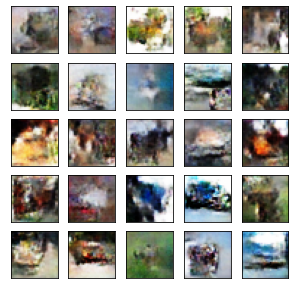

Epoch[168/300],d_loss:1.141767,g_loss:0.944086 D real: 0.534595,D fake: 0.395637
Epoch[168/300],d_loss:1.027181,g_loss:0.877339 D real: 0.586760,D fake: 0.424024
Epoch[168/300],d_loss:0.914133,g_loss:1.021124 D real: 0.637158,D fake: 0.369901
Epoch[168/300],d_loss:1.066986,g_loss:1.010557 D real: 0.627533,D fake: 0.376135


 56%|█████▋    | 169/300 [41:02<32:46, 15.01s/it]

Epoch[169/300],d_loss:1.151674,g_loss:1.148727 D real: 0.622605,D fake: 0.333660
Epoch[169/300],d_loss:0.998909,g_loss:1.001664 D real: 0.589489,D fake: 0.373155
Epoch[169/300],d_loss:0.972973,g_loss:0.906501 D real: 0.553569,D fake: 0.413884
Epoch[169/300],d_loss:1.117085,g_loss:1.012339 D real: 0.613980,D fake: 0.371830


 57%|█████▋    | 170/300 [41:15<31:23, 14.49s/it]

Epoch[170/300],d_loss:1.086592,g_loss:1.252209 D real: 0.663016,D fake: 0.295216
Epoch[170/300],d_loss:0.965476,g_loss:0.806601 D real: 0.549690,D fake: 0.452815
Epoch[170/300],d_loss:1.119130,g_loss:0.953544 D real: 0.595869,D fake: 0.395911
Epoch[170/300],d_loss:1.130888,g_loss:0.944759 D real: 0.616018,D fake: 0.414662


 57%|█████▋    | 171/300 [41:28<30:14, 14.07s/it]

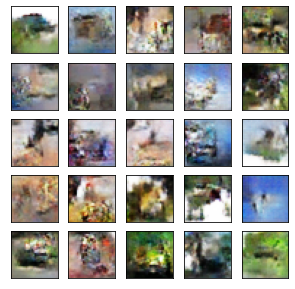

Epoch[171/300],d_loss:1.210741,g_loss:0.860923 D real: 0.545591,D fake: 0.433468
Epoch[171/300],d_loss:1.105245,g_loss:0.805165 D real: 0.598920,D fake: 0.454256
Epoch[171/300],d_loss:1.038858,g_loss:0.925297 D real: 0.555523,D fake: 0.404210
Epoch[171/300],d_loss:1.102704,g_loss:0.879033 D real: 0.560633,D fake: 0.420081


 57%|█████▋    | 172/300 [41:45<31:46, 14.90s/it]

Epoch[172/300],d_loss:1.075464,g_loss:0.851589 D real: 0.556818,D fake: 0.432984
Epoch[172/300],d_loss:1.009752,g_loss:1.037691 D real: 0.587000,D fake: 0.365654
Epoch[172/300],d_loss:1.111457,g_loss:0.870345 D real: 0.586956,D fake: 0.429478
Epoch[172/300],d_loss:1.084793,g_loss:0.780158 D real: 0.564349,D fake: 0.465609


 58%|█████▊    | 173/300 [42:00<31:12, 14.74s/it]

Epoch[173/300],d_loss:1.200850,g_loss:1.101603 D real: 0.587882,D fake: 0.337587
Epoch[173/300],d_loss:1.149693,g_loss:0.841391 D real: 0.565367,D fake: 0.438118
Epoch[173/300],d_loss:1.080491,g_loss:0.970726 D real: 0.605262,D fake: 0.388522
Epoch[173/300],d_loss:1.098294,g_loss:0.833230 D real: 0.546234,D fake: 0.441162


 58%|█████▊    | 174/300 [42:14<30:39, 14.60s/it]

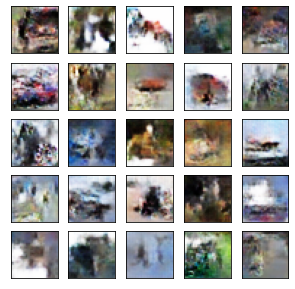

Epoch[174/300],d_loss:1.082219,g_loss:1.049638 D real: 0.555793,D fake: 0.359370
Epoch[174/300],d_loss:1.006648,g_loss:0.952001 D real: 0.623665,D fake: 0.400358
Epoch[174/300],d_loss:0.978625,g_loss:1.012112 D real: 0.611183,D fake: 0.373821
Epoch[174/300],d_loss:1.043928,g_loss:0.966015 D real: 0.616473,D fake: 0.390121


 58%|█████▊    | 175/300 [42:30<31:32, 15.14s/it]

Epoch[175/300],d_loss:1.179031,g_loss:1.070394 D real: 0.599737,D fake: 0.352397
Epoch[175/300],d_loss:1.139832,g_loss:0.865648 D real: 0.512550,D fake: 0.432563
Epoch[175/300],d_loss:1.040548,g_loss:0.916363 D real: 0.568657,D fake: 0.409816
Epoch[175/300],d_loss:1.083518,g_loss:1.057319 D real: 0.660858,D fake: 0.358474


 59%|█████▊    | 176/300 [42:45<31:02, 15.02s/it]

Epoch[176/300],d_loss:1.221455,g_loss:0.977953 D real: 0.617765,D fake: 0.384810
Epoch[176/300],d_loss:1.114487,g_loss:1.139408 D real: 0.660188,D fake: 0.333009
Epoch[176/300],d_loss:1.141214,g_loss:0.933835 D real: 0.542712,D fake: 0.403589
Epoch[176/300],d_loss:0.916512,g_loss:1.015512 D real: 0.635519,D fake: 0.373856


 59%|█████▉    | 177/300 [43:00<30:38, 14.94s/it]

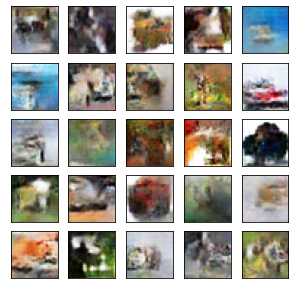

Epoch[177/300],d_loss:1.145529,g_loss:0.963687 D real: 0.607144,D fake: 0.392341
Epoch[177/300],d_loss:1.111506,g_loss:0.743560 D real: 0.544761,D fake: 0.484473
Epoch[177/300],d_loss:1.064085,g_loss:0.998159 D real: 0.609082,D fake: 0.376554
Epoch[177/300],d_loss:1.096059,g_loss:0.970458 D real: 0.596667,D fake: 0.385061


 59%|█████▉    | 178/300 [43:15<30:26, 14.97s/it]

Epoch[178/300],d_loss:1.258291,g_loss:0.818822 D real: 0.563242,D fake: 0.448722
Epoch[178/300],d_loss:1.151809,g_loss:0.879417 D real: 0.562616,D fake: 0.424644
Epoch[178/300],d_loss:1.210802,g_loss:0.919688 D real: 0.579447,D fake: 0.410618
Epoch[178/300],d_loss:1.223783,g_loss:0.849339 D real: 0.542693,D fake: 0.433772


 60%|█████▉    | 179/300 [43:28<28:58, 14.37s/it]

Epoch[179/300],d_loss:1.193488,g_loss:0.947931 D real: 0.548668,D fake: 0.400463
Epoch[179/300],d_loss:1.027954,g_loss:0.937977 D real: 0.569306,D fake: 0.398617
Epoch[179/300],d_loss:1.062468,g_loss:0.910295 D real: 0.587782,D fake: 0.416878
Epoch[179/300],d_loss:1.236584,g_loss:0.899120 D real: 0.589594,D fake: 0.428449


 60%|██████    | 180/300 [43:43<29:07, 14.56s/it]

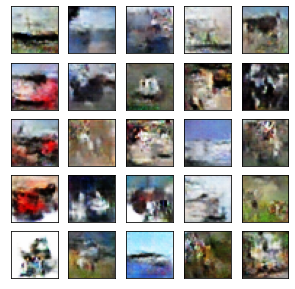

Epoch[180/300],d_loss:1.295462,g_loss:0.740950 D real: 0.547037,D fake: 0.485222
Epoch[180/300],d_loss:1.039921,g_loss:0.861513 D real: 0.570918,D fake: 0.429097
Epoch[180/300],d_loss:1.076187,g_loss:0.900712 D real: 0.582934,D fake: 0.413267
Epoch[180/300],d_loss:1.066169,g_loss:0.892817 D real: 0.584841,D fake: 0.419713


 60%|██████    | 181/300 [43:56<28:23, 14.31s/it]

Epoch[181/300],d_loss:1.053695,g_loss:1.127661 D real: 0.637319,D fake: 0.332870
Epoch[181/300],d_loss:1.153659,g_loss:0.863164 D real: 0.585064,D fake: 0.428690
Epoch[181/300],d_loss:1.053926,g_loss:0.966465 D real: 0.583664,D fake: 0.387194
Epoch[181/300],d_loss:1.171522,g_loss:0.811763 D real: 0.543537,D fake: 0.452608


 61%|██████    | 182/300 [44:09<26:49, 13.64s/it]

Epoch[182/300],d_loss:1.169111,g_loss:0.982363 D real: 0.642385,D fake: 0.383618
Epoch[182/300],d_loss:1.031553,g_loss:0.920612 D real: 0.581053,D fake: 0.404117
Epoch[182/300],d_loss:1.020617,g_loss:0.890712 D real: 0.598855,D fake: 0.419348
Epoch[182/300],d_loss:1.016083,g_loss:1.016238 D real: 0.587623,D fake: 0.368341


 61%|██████    | 183/300 [44:23<27:12, 13.95s/it]

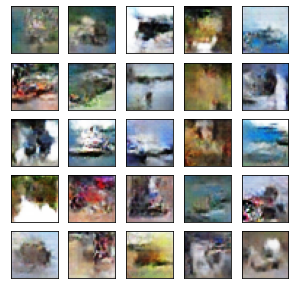

Epoch[183/300],d_loss:1.160757,g_loss:1.073881 D real: 0.625800,D fake: 0.347895
Epoch[183/300],d_loss:1.127923,g_loss:0.783771 D real: 0.521243,D fake: 0.461662
Epoch[183/300],d_loss:1.112543,g_loss:0.915189 D real: 0.571273,D fake: 0.407845
Epoch[183/300],d_loss:1.017029,g_loss:0.925787 D real: 0.589402,D fake: 0.407915


 61%|██████▏   | 184/300 [44:40<28:37, 14.80s/it]

Epoch[184/300],d_loss:1.075889,g_loss:0.954602 D real: 0.557680,D fake: 0.395412
Epoch[184/300],d_loss:1.105032,g_loss:1.110148 D real: 0.633899,D fake: 0.339615
Epoch[184/300],d_loss:1.245641,g_loss:0.762876 D real: 0.501008,D fake: 0.474588
Epoch[184/300],d_loss:1.083367,g_loss:0.794258 D real: 0.528511,D fake: 0.460473


 62%|██████▏   | 185/300 [44:54<28:01, 14.62s/it]

Epoch[185/300],d_loss:1.000660,g_loss:1.161926 D real: 0.618410,D fake: 0.321302
Epoch[185/300],d_loss:1.133085,g_loss:1.107799 D real: 0.667733,D fake: 0.342726
Epoch[185/300],d_loss:1.051905,g_loss:1.041197 D real: 0.647427,D fake: 0.360437
Epoch[185/300],d_loss:1.026398,g_loss:0.987297 D real: 0.613582,D fake: 0.380162


 62%|██████▏   | 186/300 [45:08<27:12, 14.32s/it]

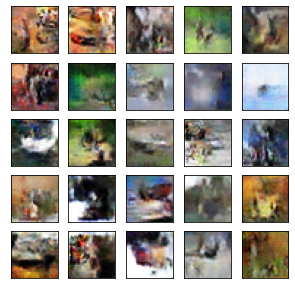

Epoch[186/300],d_loss:1.127178,g_loss:1.143954 D real: 0.617119,D fake: 0.329276
Epoch[186/300],d_loss:1.007330,g_loss:0.958904 D real: 0.618640,D fake: 0.395474
Epoch[186/300],d_loss:1.108283,g_loss:0.965883 D real: 0.632505,D fake: 0.391296
Epoch[186/300],d_loss:1.150907,g_loss:0.921810 D real: 0.587885,D fake: 0.404925


 62%|██████▏   | 187/300 [45:26<29:04, 15.44s/it]

Epoch[187/300],d_loss:1.217574,g_loss:0.969663 D real: 0.561294,D fake: 0.389408
Epoch[187/300],d_loss:1.275015,g_loss:0.809037 D real: 0.585479,D fake: 0.453555
Epoch[187/300],d_loss:0.971175,g_loss:1.099730 D real: 0.643690,D fake: 0.344072
Epoch[187/300],d_loss:1.130968,g_loss:0.881105 D real: 0.599903,D fake: 0.432243


 63%|██████▎   | 188/300 [45:41<28:39, 15.35s/it]

Epoch[188/300],d_loss:1.302139,g_loss:0.911136 D real: 0.560922,D fake: 0.409085
Epoch[188/300],d_loss:1.050052,g_loss:0.803112 D real: 0.555727,D fake: 0.455896
Epoch[188/300],d_loss:1.096277,g_loss:0.966933 D real: 0.604432,D fake: 0.386420
Epoch[188/300],d_loss:1.107462,g_loss:1.011858 D real: 0.616077,D fake: 0.373143


 63%|██████▎   | 189/300 [45:56<27:54, 15.09s/it]

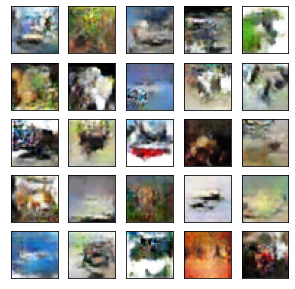

Epoch[189/300],d_loss:1.103403,g_loss:1.171626 D real: 0.622247,D fake: 0.326384
Epoch[189/300],d_loss:1.057238,g_loss:1.055357 D real: 0.641528,D fake: 0.362382
Epoch[189/300],d_loss:1.014984,g_loss:0.859826 D real: 0.587905,D fake: 0.430837
Epoch[189/300],d_loss:1.046734,g_loss:0.873659 D real: 0.618593,D fake: 0.431188


 63%|██████▎   | 190/300 [46:12<28:16, 15.42s/it]

Epoch[190/300],d_loss:1.354527,g_loss:0.928388 D real: 0.588555,D fake: 0.405509
Epoch[190/300],d_loss:1.038498,g_loss:0.913758 D real: 0.557162,D fake: 0.414037
Epoch[190/300],d_loss:1.011846,g_loss:1.032014 D real: 0.622136,D fake: 0.364351
Epoch[190/300],d_loss:1.100317,g_loss:0.825706 D real: 0.575614,D fake: 0.447459


 64%|██████▎   | 191/300 [46:26<27:37, 15.20s/it]

Epoch[191/300],d_loss:1.195956,g_loss:0.877697 D real: 0.513888,D fake: 0.423533
Epoch[191/300],d_loss:1.115676,g_loss:0.839283 D real: 0.555697,D fake: 0.439923
Epoch[191/300],d_loss:1.048779,g_loss:1.064101 D real: 0.606702,D fake: 0.357432
Epoch[191/300],d_loss:1.121559,g_loss:1.140275 D real: 0.649387,D fake: 0.338494


 64%|██████▍   | 192/300 [46:40<26:32, 14.75s/it]

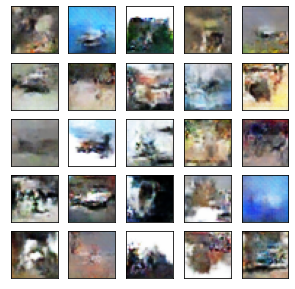

Epoch[192/300],d_loss:1.283554,g_loss:0.804173 D real: 0.509036,D fake: 0.455811
Epoch[192/300],d_loss:1.118884,g_loss:1.458221 D real: 0.676096,D fake: 0.255394
Epoch[192/300],d_loss:1.289150,g_loss:0.813953 D real: 0.535039,D fake: 0.454499
Epoch[192/300],d_loss:1.102034,g_loss:0.939530 D real: 0.575945,D fake: 0.402265


 64%|██████▍   | 193/300 [46:58<27:51, 15.62s/it]

Epoch[193/300],d_loss:1.189588,g_loss:1.181861 D real: 0.620614,D fake: 0.316320
Epoch[193/300],d_loss:1.082004,g_loss:0.859889 D real: 0.609931,D fake: 0.428756
Epoch[193/300],d_loss:1.092862,g_loss:0.860355 D real: 0.609583,D fake: 0.431369
Epoch[193/300],d_loss:1.017704,g_loss:1.071860 D real: 0.623696,D fake: 0.353703


 65%|██████▍   | 194/300 [47:12<27:00, 15.29s/it]

Epoch[194/300],d_loss:1.099255,g_loss:1.058148 D real: 0.625376,D fake: 0.355232
Epoch[194/300],d_loss:1.291270,g_loss:0.633969 D real: 0.443827,D fake: 0.539558
Epoch[194/300],d_loss:1.229337,g_loss:0.787528 D real: 0.469133,D fake: 0.461348
Epoch[194/300],d_loss:1.070573,g_loss:0.965709 D real: 0.600469,D fake: 0.390060


 65%|██████▌   | 195/300 [47:27<26:19, 15.04s/it]

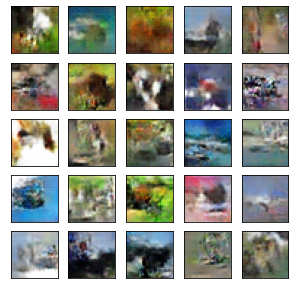

Epoch[195/300],d_loss:1.168346,g_loss:0.931084 D real: 0.567526,D fake: 0.402331
Epoch[195/300],d_loss:0.960646,g_loss:1.020330 D real: 0.628753,D fake: 0.370936
Epoch[195/300],d_loss:1.090164,g_loss:0.861843 D real: 0.575698,D fake: 0.436359
Epoch[195/300],d_loss:1.265518,g_loss:0.821305 D real: 0.571755,D fake: 0.445380


 65%|██████▌   | 196/300 [47:43<26:27, 15.27s/it]

Epoch[196/300],d_loss:1.222058,g_loss:0.844540 D real: 0.528237,D fake: 0.441432
Epoch[196/300],d_loss:0.945857,g_loss:0.983686 D real: 0.570156,D fake: 0.390851
Epoch[196/300],d_loss:1.059299,g_loss:0.953323 D real: 0.619502,D fake: 0.393713
Epoch[196/300],d_loss:1.156590,g_loss:0.952626 D real: 0.565606,D fake: 0.395587


 66%|██████▌   | 197/300 [47:58<26:27, 15.41s/it]

Epoch[197/300],d_loss:1.322220,g_loss:0.842027 D real: 0.528390,D fake: 0.453080
Epoch[197/300],d_loss:0.980603,g_loss:1.070541 D real: 0.632081,D fake: 0.352884
Epoch[197/300],d_loss:1.142396,g_loss:0.795987 D real: 0.530009,D fake: 0.455062
Epoch[197/300],d_loss:1.166817,g_loss:0.975347 D real: 0.606350,D fake: 0.382342


 66%|██████▌   | 198/300 [48:14<26:20, 15.50s/it]

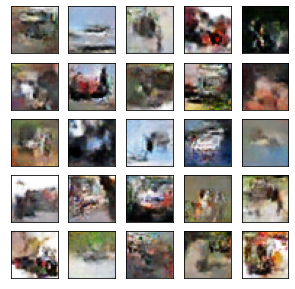

Epoch[198/300],d_loss:1.155739,g_loss:0.990834 D real: 0.589038,D fake: 0.381077
Epoch[198/300],d_loss:1.040813,g_loss:0.777209 D real: 0.543457,D fake: 0.470794
Epoch[198/300],d_loss:1.145177,g_loss:0.847296 D real: 0.554203,D fake: 0.435104
Epoch[198/300],d_loss:1.028704,g_loss:0.959465 D real: 0.609362,D fake: 0.391650


 66%|██████▋   | 199/300 [48:30<26:26, 15.70s/it]

Epoch[199/300],d_loss:1.269727,g_loss:1.018869 D real: 0.630776,D fake: 0.369766
Epoch[199/300],d_loss:1.182166,g_loss:0.827134 D real: 0.566530,D fake: 0.446405
Epoch[199/300],d_loss:1.091812,g_loss:0.883729 D real: 0.601836,D fake: 0.419343
Epoch[199/300],d_loss:1.073839,g_loss:0.839940 D real: 0.593412,D fake: 0.439848


 67%|██████▋   | 200/300 [48:44<25:09, 15.09s/it]

Epoch[200/300],d_loss:1.187337,g_loss:1.125787 D real: 0.626425,D fake: 0.337198
Epoch[200/300],d_loss:0.987699,g_loss:0.922446 D real: 0.600962,D fake: 0.405944
Epoch[200/300],d_loss:1.188142,g_loss:0.856622 D real: 0.555209,D fake: 0.435525
Epoch[200/300],d_loss:1.171355,g_loss:0.839953 D real: 0.553999,D fake: 0.439750


 67%|██████▋   | 201/300 [48:59<24:47, 15.03s/it]

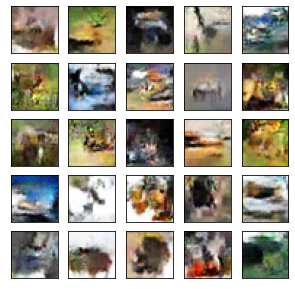

Epoch[201/300],d_loss:1.319418,g_loss:0.805710 D real: 0.530267,D fake: 0.456737
Epoch[201/300],d_loss:1.109550,g_loss:0.841196 D real: 0.575434,D fake: 0.441856
Epoch[201/300],d_loss:1.010734,g_loss:0.948224 D real: 0.614078,D fake: 0.398421
Epoch[201/300],d_loss:0.987250,g_loss:0.856113 D real: 0.574355,D fake: 0.435148


 67%|██████▋   | 202/300 [49:14<24:41, 15.12s/it]

Epoch[202/300],d_loss:1.157491,g_loss:1.003929 D real: 0.594562,D fake: 0.373330
Epoch[202/300],d_loss:1.079490,g_loss:0.863221 D real: 0.585648,D fake: 0.431333
Epoch[202/300],d_loss:1.058624,g_loss:0.842467 D real: 0.563616,D fake: 0.437178
Epoch[202/300],d_loss:1.135291,g_loss:0.823698 D real: 0.604257,D fake: 0.444720


 68%|██████▊   | 203/300 [49:30<24:37, 15.24s/it]

Epoch[203/300],d_loss:1.173311,g_loss:0.940553 D real: 0.534595,D fake: 0.399607
Epoch[203/300],d_loss:1.081072,g_loss:0.916615 D real: 0.577801,D fake: 0.407350
Epoch[203/300],d_loss:1.079459,g_loss:1.049639 D real: 0.624752,D fake: 0.360131
Epoch[203/300],d_loss:1.155741,g_loss:0.798183 D real: 0.543872,D fake: 0.455250


 68%|██████▊   | 204/300 [49:45<24:21, 15.22s/it]

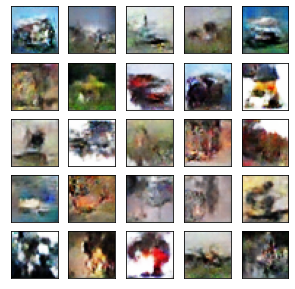

Epoch[204/300],d_loss:1.343473,g_loss:1.218924 D real: 0.702542,D fake: 0.301042
Epoch[204/300],d_loss:1.142559,g_loss:0.865168 D real: 0.597661,D fake: 0.426477
Epoch[204/300],d_loss:1.076763,g_loss:0.845202 D real: 0.573150,D fake: 0.437783
Epoch[204/300],d_loss:1.257362,g_loss:0.836442 D real: 0.534412,D fake: 0.441541


 68%|██████▊   | 205/300 [50:02<24:52, 15.71s/it]

Epoch[205/300],d_loss:1.363752,g_loss:0.641638 D real: 0.470883,D fake: 0.534435
Epoch[205/300],d_loss:1.105449,g_loss:0.871135 D real: 0.552760,D fake: 0.425926
Epoch[205/300],d_loss:1.253570,g_loss:0.720828 D real: 0.513194,D fake: 0.496885
Epoch[205/300],d_loss:1.105794,g_loss:0.828323 D real: 0.563141,D fake: 0.444155


 69%|██████▊   | 206/300 [50:17<24:28, 15.62s/it]

Epoch[206/300],d_loss:1.401954,g_loss:0.806435 D real: 0.533687,D fake: 0.456585
Epoch[206/300],d_loss:1.250035,g_loss:0.533163 D real: 0.486673,D fake: 0.592447
Epoch[206/300],d_loss:1.231371,g_loss:0.789661 D real: 0.556047,D fake: 0.461756
Epoch[206/300],d_loss:1.039538,g_loss:0.955516 D real: 0.605412,D fake: 0.391949


 69%|██████▉   | 207/300 [50:33<24:20, 15.70s/it]

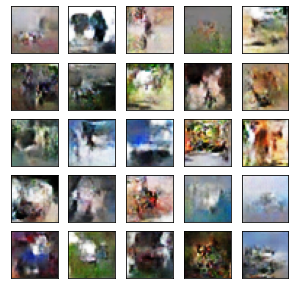

Epoch[207/300],d_loss:1.121818,g_loss:0.968700 D real: 0.610468,D fake: 0.385729
Epoch[207/300],d_loss:1.132905,g_loss:0.803934 D real: 0.558284,D fake: 0.454587
Epoch[207/300],d_loss:1.107569,g_loss:0.966536 D real: 0.628639,D fake: 0.388238
Epoch[207/300],d_loss:1.221646,g_loss:0.932240 D real: 0.622876,D fake: 0.401155


 69%|██████▉   | 208/300 [50:52<25:26, 16.59s/it]

Epoch[208/300],d_loss:1.280049,g_loss:1.159751 D real: 0.672640,D fake: 0.322430
Epoch[208/300],d_loss:1.034605,g_loss:0.945461 D real: 0.596778,D fake: 0.396423
Epoch[208/300],d_loss:1.052805,g_loss:0.835172 D real: 0.561456,D fake: 0.441073
Epoch[208/300],d_loss:1.166391,g_loss:0.867625 D real: 0.597392,D fake: 0.434428


 70%|██████▉   | 209/300 [51:06<24:03, 15.86s/it]

Epoch[209/300],d_loss:1.330563,g_loss:0.702492 D real: 0.510146,D fake: 0.502493
Epoch[209/300],d_loss:1.035008,g_loss:0.882569 D real: 0.620409,D fake: 0.423191
Epoch[209/300],d_loss:1.080533,g_loss:0.978158 D real: 0.597978,D fake: 0.387477
Epoch[209/300],d_loss:1.154090,g_loss:0.894379 D real: 0.542729,D fake: 0.414834


 70%|███████   | 210/300 [51:19<22:47, 15.20s/it]

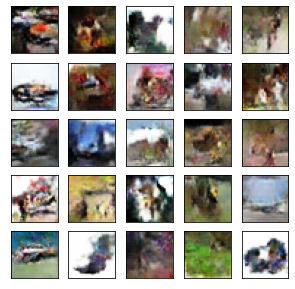

Epoch[210/300],d_loss:1.271780,g_loss:0.909472 D real: 0.586991,D fake: 0.411898
Epoch[210/300],d_loss:1.189892,g_loss:0.778097 D real: 0.538561,D fake: 0.464633
Epoch[210/300],d_loss:1.072116,g_loss:0.952069 D real: 0.601997,D fake: 0.392873
Epoch[210/300],d_loss:1.211591,g_loss:0.675228 D real: 0.506302,D fake: 0.513992


 70%|███████   | 211/300 [51:35<22:36, 15.25s/it]

Epoch[211/300],d_loss:1.182646,g_loss:0.935136 D real: 0.583676,D fake: 0.397055
Epoch[211/300],d_loss:1.146619,g_loss:0.807981 D real: 0.540629,D fake: 0.451367
Epoch[211/300],d_loss:1.065458,g_loss:0.947812 D real: 0.596540,D fake: 0.392138
Epoch[211/300],d_loss:1.003637,g_loss:0.826886 D real: 0.583168,D fake: 0.443406


 71%|███████   | 212/300 [51:49<21:57, 14.98s/it]

Epoch[212/300],d_loss:1.033819,g_loss:1.234981 D real: 0.655561,D fake: 0.298902
Epoch[212/300],d_loss:1.198183,g_loss:0.925439 D real: 0.593435,D fake: 0.402861
Epoch[212/300],d_loss:1.224385,g_loss:0.821664 D real: 0.529935,D fake: 0.445295
Epoch[212/300],d_loss:1.070710,g_loss:1.070704 D real: 0.681129,D fake: 0.348473


 71%|███████   | 213/300 [52:04<21:30, 14.83s/it]

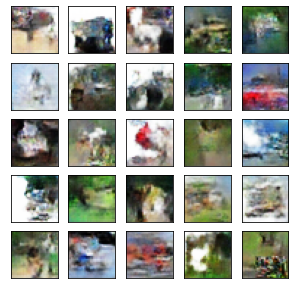

Epoch[213/300],d_loss:1.139330,g_loss:1.043515 D real: 0.611730,D fake: 0.361253
Epoch[213/300],d_loss:1.170988,g_loss:0.887228 D real: 0.582997,D fake: 0.418860
Epoch[213/300],d_loss:1.221306,g_loss:0.785828 D real: 0.513634,D fake: 0.462149
Epoch[213/300],d_loss:1.243333,g_loss:0.827718 D real: 0.540616,D fake: 0.447278


 71%|███████▏  | 214/300 [52:18<21:12, 14.79s/it]

Epoch[214/300],d_loss:1.268200,g_loss:0.932871 D real: 0.590558,D fake: 0.400322
Epoch[214/300],d_loss:1.135716,g_loss:1.031283 D real: 0.589211,D fake: 0.368759
Epoch[214/300],d_loss:1.090420,g_loss:0.997951 D real: 0.600154,D fake: 0.375831
Epoch[214/300],d_loss:1.000923,g_loss:1.004893 D real: 0.613278,D fake: 0.372321


 72%|███████▏  | 215/300 [52:34<21:10, 14.95s/it]

Epoch[215/300],d_loss:1.078909,g_loss:1.042145 D real: 0.624909,D fake: 0.363486
Epoch[215/300],d_loss:1.041165,g_loss:0.869906 D real: 0.565883,D fake: 0.426902
Epoch[215/300],d_loss:1.228184,g_loss:0.750013 D real: 0.530808,D fake: 0.477356
Epoch[215/300],d_loss:1.111162,g_loss:0.936130 D real: 0.643311,D fake: 0.398906


 72%|███████▏  | 216/300 [52:50<21:25, 15.31s/it]

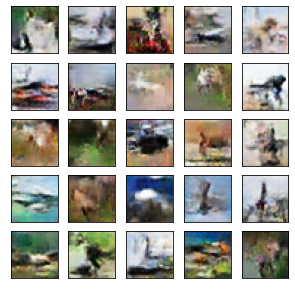

Epoch[216/300],d_loss:1.267655,g_loss:0.930675 D real: 0.574959,D fake: 0.400554
Epoch[216/300],d_loss:1.289874,g_loss:0.823279 D real: 0.541198,D fake: 0.445083
Epoch[216/300],d_loss:1.122793,g_loss:0.881646 D real: 0.593346,D fake: 0.421704
Epoch[216/300],d_loss:1.180977,g_loss:0.821803 D real: 0.561998,D fake: 0.444801


 72%|███████▏  | 217/300 [53:07<22:09, 16.02s/it]

Epoch[217/300],d_loss:1.279353,g_loss:0.942249 D real: 0.586714,D fake: 0.396732
Epoch[217/300],d_loss:1.182274,g_loss:0.810250 D real: 0.560052,D fake: 0.452183
Epoch[217/300],d_loss:1.104704,g_loss:0.955795 D real: 0.600488,D fake: 0.393609
Epoch[217/300],d_loss:1.073346,g_loss:0.874096 D real: 0.579037,D fake: 0.425694


 73%|███████▎  | 218/300 [53:23<21:39, 15.85s/it]

Epoch[218/300],d_loss:1.135915,g_loss:0.995344 D real: 0.605890,D fake: 0.380609
Epoch[218/300],d_loss:1.057676,g_loss:0.848712 D real: 0.568888,D fake: 0.441107
Epoch[218/300],d_loss:1.165937,g_loss:0.812673 D real: 0.545348,D fake: 0.452801
Epoch[218/300],d_loss:1.100159,g_loss:0.896570 D real: 0.560706,D fake: 0.418041


 73%|███████▎  | 219/300 [53:38<21:00, 15.56s/it]

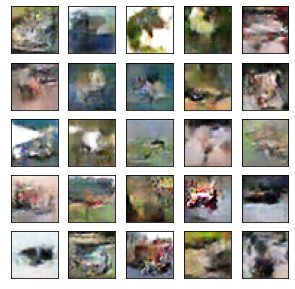

Epoch[219/300],d_loss:1.128602,g_loss:0.965133 D real: 0.625659,D fake: 0.391951
Epoch[219/300],d_loss:1.117302,g_loss:1.007138 D real: 0.582519,D fake: 0.370128
Epoch[219/300],d_loss:1.134952,g_loss:0.998851 D real: 0.576563,D fake: 0.379377
Epoch[219/300],d_loss:1.089562,g_loss:0.920571 D real: 0.599762,D fake: 0.404341


 73%|███████▎  | 220/300 [53:56<21:52, 16.41s/it]

Epoch[220/300],d_loss:1.394844,g_loss:0.924076 D real: 0.595580,D fake: 0.406923
Epoch[220/300],d_loss:1.236890,g_loss:0.847161 D real: 0.556692,D fake: 0.440326
Epoch[220/300],d_loss:1.131519,g_loss:0.863550 D real: 0.579584,D fake: 0.428015
Epoch[220/300],d_loss:1.056197,g_loss:0.923940 D real: 0.604028,D fake: 0.404180


 74%|███████▎  | 221/300 [54:11<21:09, 16.07s/it]

Epoch[221/300],d_loss:1.201655,g_loss:1.018461 D real: 0.626399,D fake: 0.370965
Epoch[221/300],d_loss:1.079421,g_loss:0.978832 D real: 0.647467,D fake: 0.381317
Epoch[221/300],d_loss:1.058294,g_loss:0.954776 D real: 0.617318,D fake: 0.392990
Epoch[221/300],d_loss:1.164916,g_loss:0.805274 D real: 0.555525,D fake: 0.453883


 74%|███████▍  | 222/300 [54:27<20:36, 15.86s/it]

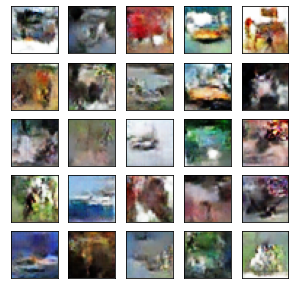

Epoch[222/300],d_loss:1.180720,g_loss:1.104518 D real: 0.612382,D fake: 0.338344
Epoch[222/300],d_loss:1.167162,g_loss:0.973711 D real: 0.598362,D fake: 0.385438
Epoch[222/300],d_loss:0.974618,g_loss:0.962824 D real: 0.593109,D fake: 0.390672
Epoch[222/300],d_loss:1.130936,g_loss:0.778821 D real: 0.568470,D fake: 0.470537


 74%|███████▍  | 223/300 [54:43<20:35, 16.05s/it]

Epoch[223/300],d_loss:1.222102,g_loss:1.007311 D real: 0.570053,D fake: 0.372655
Epoch[223/300],d_loss:1.136309,g_loss:0.906135 D real: 0.563166,D fake: 0.410507
Epoch[223/300],d_loss:1.186318,g_loss:0.838123 D real: 0.580849,D fake: 0.437014
Epoch[223/300],d_loss:1.178595,g_loss:0.874866 D real: 0.581679,D fake: 0.428331


 75%|███████▍  | 224/300 [54:58<19:40, 15.53s/it]

Epoch[224/300],d_loss:1.301746,g_loss:0.786351 D real: 0.509302,D fake: 0.459947
Epoch[224/300],d_loss:1.064336,g_loss:0.955206 D real: 0.600431,D fake: 0.391031
Epoch[224/300],d_loss:1.314463,g_loss:0.725874 D real: 0.518600,D fake: 0.489596
Epoch[224/300],d_loss:1.096825,g_loss:0.901193 D real: 0.574042,D fake: 0.435240


 75%|███████▌  | 225/300 [55:11<18:37, 14.90s/it]

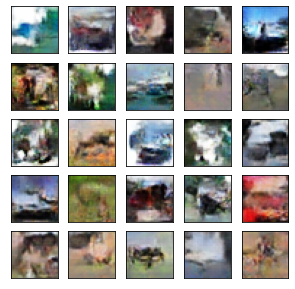

Epoch[225/300],d_loss:1.235189,g_loss:0.950912 D real: 0.644885,D fake: 0.395290
Epoch[225/300],d_loss:1.154286,g_loss:0.772153 D real: 0.565233,D fake: 0.466928
Epoch[225/300],d_loss:1.223911,g_loss:0.840397 D real: 0.531803,D fake: 0.438874
Epoch[225/300],d_loss:1.207868,g_loss:0.676513 D real: 0.508035,D fake: 0.518243


 75%|███████▌  | 226/300 [55:29<19:22, 15.71s/it]

Epoch[226/300],d_loss:1.225240,g_loss:0.891572 D real: 0.585983,D fake: 0.416277
Epoch[226/300],d_loss:1.188279,g_loss:0.802221 D real: 0.525724,D fake: 0.455629
Epoch[226/300],d_loss:1.186630,g_loss:0.784323 D real: 0.521854,D fake: 0.462031
Epoch[226/300],d_loss:1.099228,g_loss:0.914775 D real: 0.567832,D fake: 0.407586


 76%|███████▌  | 227/300 [55:40<17:37, 14.49s/it]

Epoch[227/300],d_loss:1.187657,g_loss:0.876132 D real: 0.514200,D fake: 0.422804
Epoch[227/300],d_loss:1.000361,g_loss:0.979509 D real: 0.647729,D fake: 0.383852
Epoch[227/300],d_loss:1.120839,g_loss:0.912340 D real: 0.592351,D fake: 0.410597
Epoch[227/300],d_loss:1.013065,g_loss:1.003361 D real: 0.641976,D fake: 0.373105


 76%|███████▌  | 228/300 [55:55<17:26, 14.54s/it]

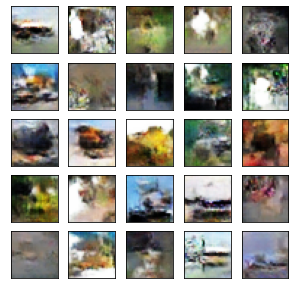

Epoch[228/300],d_loss:1.330598,g_loss:1.020267 D real: 0.626925,D fake: 0.367353
Epoch[228/300],d_loss:1.177261,g_loss:0.872283 D real: 0.505045,D fake: 0.428336
Epoch[228/300],d_loss:1.230380,g_loss:0.662404 D real: 0.506396,D fake: 0.520457
Epoch[228/300],d_loss:1.031907,g_loss:0.888377 D real: 0.582058,D fake: 0.417681


 76%|███████▋  | 229/300 [56:12<18:08, 15.33s/it]

Epoch[229/300],d_loss:1.230428,g_loss:0.953606 D real: 0.554316,D fake: 0.391815
Epoch[229/300],d_loss:1.123155,g_loss:0.811647 D real: 0.503330,D fake: 0.450372
Epoch[229/300],d_loss:1.149235,g_loss:0.895533 D real: 0.580521,D fake: 0.417668
Epoch[229/300],d_loss:1.071577,g_loss:0.987057 D real: 0.621639,D fake: 0.386251


 77%|███████▋  | 230/300 [56:26<17:22, 14.90s/it]

Epoch[230/300],d_loss:1.184224,g_loss:0.937839 D real: 0.613503,D fake: 0.396234
Epoch[230/300],d_loss:1.200428,g_loss:0.799761 D real: 0.553117,D fake: 0.457004
Epoch[230/300],d_loss:1.143694,g_loss:0.904490 D real: 0.587793,D fake: 0.417510
Epoch[230/300],d_loss:1.037394,g_loss:0.875598 D real: 0.597438,D fake: 0.423393


 77%|███████▋  | 231/300 [56:39<16:37, 14.45s/it]

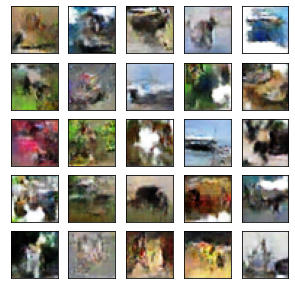

Epoch[231/300],d_loss:1.472034,g_loss:0.715163 D real: 0.482738,D fake: 0.494558
Epoch[231/300],d_loss:1.361412,g_loss:0.664561 D real: 0.495806,D fake: 0.521486
Epoch[231/300],d_loss:1.062572,g_loss:0.941444 D real: 0.585981,D fake: 0.396774
Epoch[231/300],d_loss:1.114994,g_loss:0.913924 D real: 0.589445,D fake: 0.409150


 77%|███████▋  | 232/300 [56:56<17:06, 15.09s/it]

Epoch[232/300],d_loss:1.224533,g_loss:0.779245 D real: 0.528951,D fake: 0.466562
Epoch[232/300],d_loss:1.101423,g_loss:0.948077 D real: 0.605545,D fake: 0.397467
Epoch[232/300],d_loss:1.196267,g_loss:0.848451 D real: 0.579016,D fake: 0.432873
Epoch[232/300],d_loss:1.099052,g_loss:0.998663 D real: 0.601399,D fake: 0.374874


 78%|███████▊  | 233/300 [57:11<16:47, 15.04s/it]

Epoch[233/300],d_loss:1.357232,g_loss:0.956903 D real: 0.570535,D fake: 0.398951
Epoch[233/300],d_loss:0.996140,g_loss:0.914653 D real: 0.596785,D fake: 0.411245
Epoch[233/300],d_loss:1.281018,g_loss:0.838062 D real: 0.541357,D fake: 0.438343
Epoch[233/300],d_loss:1.055687,g_loss:0.819109 D real: 0.559678,D fake: 0.449537


 78%|███████▊  | 234/300 [57:25<16:22, 14.88s/it]

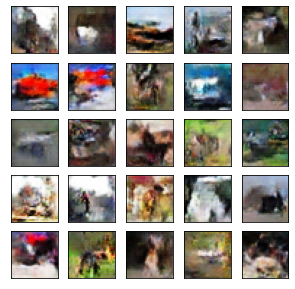

Epoch[234/300],d_loss:1.281392,g_loss:1.210443 D real: 0.641018,D fake: 0.305052
Epoch[234/300],d_loss:1.028929,g_loss:1.016710 D real: 0.631007,D fake: 0.371731
Epoch[234/300],d_loss:1.071496,g_loss:0.942671 D real: 0.617598,D fake: 0.394103
Epoch[234/300],d_loss:1.105565,g_loss:0.822263 D real: 0.580856,D fake: 0.446190


 78%|███████▊  | 235/300 [57:43<16:53, 15.59s/it]

Epoch[235/300],d_loss:1.232559,g_loss:0.893851 D real: 0.597780,D fake: 0.414609
Epoch[235/300],d_loss:1.106318,g_loss:0.898425 D real: 0.586429,D fake: 0.417363
Epoch[235/300],d_loss:1.055361,g_loss:0.962298 D real: 0.606015,D fake: 0.389761
Epoch[235/300],d_loss:1.073385,g_loss:1.046177 D real: 0.654572,D fake: 0.363209


 79%|███████▊  | 236/300 [57:58<16:24, 15.38s/it]

Epoch[236/300],d_loss:1.197101,g_loss:0.901685 D real: 0.525273,D fake: 0.413425
Epoch[236/300],d_loss:1.155251,g_loss:1.018859 D real: 0.601804,D fake: 0.368405
Epoch[236/300],d_loss:1.138371,g_loss:0.713016 D real: 0.531684,D fake: 0.504054
Epoch[236/300],d_loss:1.080866,g_loss:0.872981 D real: 0.581296,D fake: 0.424327


 79%|███████▉  | 237/300 [58:13<16:15, 15.49s/it]

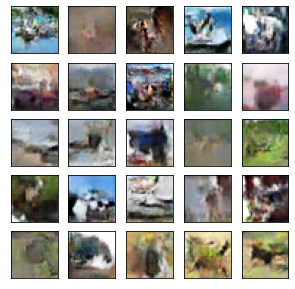

Epoch[237/300],d_loss:1.191031,g_loss:0.988427 D real: 0.587540,D fake: 0.380208
Epoch[237/300],d_loss:1.112454,g_loss:1.098455 D real: 0.661218,D fake: 0.342076
Epoch[237/300],d_loss:1.111546,g_loss:0.902784 D real: 0.581486,D fake: 0.412940
Epoch[237/300],d_loss:1.160227,g_loss:0.920425 D real: 0.595983,D fake: 0.403212


 79%|███████▉  | 238/300 [58:31<16:39, 16.12s/it]

Epoch[238/300],d_loss:1.227116,g_loss:0.985423 D real: 0.606942,D fake: 0.380947
Epoch[238/300],d_loss:1.186869,g_loss:0.931183 D real: 0.620529,D fake: 0.403601
Epoch[238/300],d_loss:1.126559,g_loss:0.821070 D real: 0.562813,D fake: 0.448589
Epoch[238/300],d_loss:1.244317,g_loss:0.825912 D real: 0.530688,D fake: 0.444303


 80%|███████▉  | 239/300 [58:45<15:43, 15.46s/it]

Epoch[239/300],d_loss:1.372893,g_loss:0.859727 D real: 0.609816,D fake: 0.428901
Epoch[239/300],d_loss:1.234896,g_loss:0.834714 D real: 0.558383,D fake: 0.443449
Epoch[239/300],d_loss:1.094439,g_loss:0.947959 D real: 0.601032,D fake: 0.405136
Epoch[239/300],d_loss:1.036990,g_loss:0.963547 D real: 0.605086,D fake: 0.386274


 80%|████████  | 240/300 [58:59<15:02, 15.04s/it]

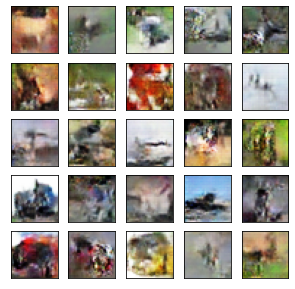

Epoch[240/300],d_loss:1.303835,g_loss:0.870202 D real: 0.596545,D fake: 0.427062
Epoch[240/300],d_loss:1.182677,g_loss:0.941656 D real: 0.575980,D fake: 0.399470
Epoch[240/300],d_loss:1.129744,g_loss:0.790499 D real: 0.556319,D fake: 0.462791
Epoch[240/300],d_loss:1.142360,g_loss:0.890537 D real: 0.625151,D fake: 0.415408


 80%|████████  | 241/300 [59:13<14:39, 14.91s/it]

Epoch[241/300],d_loss:1.132036,g_loss:1.013766 D real: 0.631539,D fake: 0.372018
Epoch[241/300],d_loss:1.196728,g_loss:0.987212 D real: 0.622804,D fake: 0.379639
Epoch[241/300],d_loss:1.100877,g_loss:1.041674 D real: 0.622894,D fake: 0.362963
Epoch[241/300],d_loss:1.141187,g_loss:0.928043 D real: 0.650071,D fake: 0.400349


 81%|████████  | 242/300 [59:29<14:31, 15.02s/it]

Epoch[242/300],d_loss:1.312679,g_loss:1.022692 D real: 0.589501,D fake: 0.367626
Epoch[242/300],d_loss:1.161147,g_loss:0.852339 D real: 0.569466,D fake: 0.434151
Epoch[242/300],d_loss:1.015177,g_loss:1.028390 D real: 0.624833,D fake: 0.364705
Epoch[242/300],d_loss:1.178483,g_loss:0.905627 D real: 0.566557,D fake: 0.409728


 81%|████████  | 243/300 [59:43<14:06, 14.85s/it]

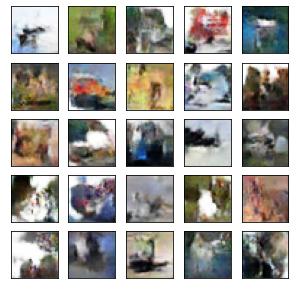

Epoch[243/300],d_loss:1.218620,g_loss:0.956576 D real: 0.536415,D fake: 0.389125
Epoch[243/300],d_loss:1.218796,g_loss:0.956758 D real: 0.586458,D fake: 0.398800
Epoch[243/300],d_loss:1.158928,g_loss:0.916011 D real: 0.555186,D fake: 0.409649
Epoch[243/300],d_loss:1.050184,g_loss:1.039788 D real: 0.609330,D fake: 0.362641


 81%|████████▏ | 244/300 [1:00:00<14:21, 15.39s/it]

Epoch[244/300],d_loss:1.262385,g_loss:0.978164 D real: 0.605505,D fake: 0.385111
Epoch[244/300],d_loss:1.197873,g_loss:0.884091 D real: 0.571611,D fake: 0.419462
Epoch[244/300],d_loss:1.235080,g_loss:0.868914 D real: 0.583338,D fake: 0.427848
Epoch[244/300],d_loss:1.039860,g_loss:1.002653 D real: 0.586533,D fake: 0.374867


 82%|████████▏ | 245/300 [1:00:15<14:07, 15.41s/it]

Epoch[245/300],d_loss:1.251899,g_loss:1.076603 D real: 0.611578,D fake: 0.350533
Epoch[245/300],d_loss:1.082094,g_loss:0.801300 D real: 0.577123,D fake: 0.455963
Epoch[245/300],d_loss:1.176749,g_loss:0.736942 D real: 0.528927,D fake: 0.486000
Epoch[245/300],d_loss:1.206404,g_loss:0.746477 D real: 0.556480,D fake: 0.485790


 82%|████████▏ | 246/300 [1:00:30<13:43, 15.26s/it]

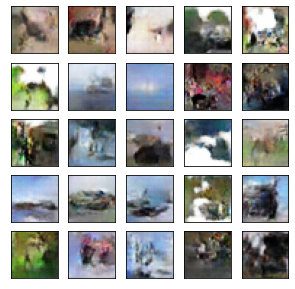

Epoch[246/300],d_loss:1.256799,g_loss:0.939027 D real: 0.582228,D fake: 0.400126
Epoch[246/300],d_loss:1.247754,g_loss:0.934631 D real: 0.579667,D fake: 0.399297
Epoch[246/300],d_loss:1.238607,g_loss:0.704476 D real: 0.508255,D fake: 0.503848
Epoch[246/300],d_loss:1.314853,g_loss:0.750133 D real: 0.544775,D fake: 0.479757


 82%|████████▏ | 247/300 [1:00:45<13:26, 15.22s/it]

Epoch[247/300],d_loss:1.298279,g_loss:0.846710 D real: 0.574044,D fake: 0.433073
Epoch[247/300],d_loss:1.111722,g_loss:0.810069 D real: 0.572526,D fake: 0.452110
Epoch[247/300],d_loss:1.224490,g_loss:0.864012 D real: 0.575777,D fake: 0.425647
Epoch[247/300],d_loss:1.195440,g_loss:0.808061 D real: 0.535386,D fake: 0.449072


 83%|████████▎ | 248/300 [1:01:00<13:11, 15.21s/it]

Epoch[248/300],d_loss:1.282698,g_loss:0.942439 D real: 0.613166,D fake: 0.400365
Epoch[248/300],d_loss:1.315493,g_loss:0.747394 D real: 0.472709,D fake: 0.478662
Epoch[248/300],d_loss:1.203926,g_loss:1.048747 D real: 0.615431,D fake: 0.362651
Epoch[248/300],d_loss:1.201056,g_loss:0.665291 D real: 0.485908,D fake: 0.522008


 83%|████████▎ | 249/300 [1:01:16<13:06, 15.42s/it]

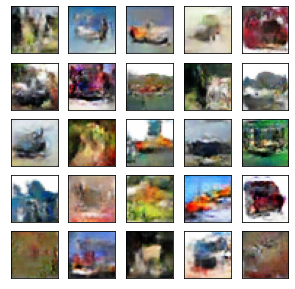

Epoch[249/300],d_loss:1.172004,g_loss:1.181076 D real: 0.613480,D fake: 0.319400
Epoch[249/300],d_loss:1.137201,g_loss:1.060550 D real: 0.641041,D fake: 0.356470
Epoch[249/300],d_loss:1.159872,g_loss:0.844955 D real: 0.583580,D fake: 0.436226
Epoch[249/300],d_loss:1.327238,g_loss:0.838724 D real: 0.515464,D fake: 0.436671


 83%|████████▎ | 250/300 [1:01:34<13:27, 16.16s/it]

Epoch[250/300],d_loss:1.174016,g_loss:0.939541 D real: 0.585063,D fake: 0.416095
Epoch[250/300],d_loss:1.223131,g_loss:0.947725 D real: 0.576679,D fake: 0.394622
Epoch[250/300],d_loss:1.212509,g_loss:0.857773 D real: 0.572425,D fake: 0.431020
Epoch[250/300],d_loss:1.278614,g_loss:0.757929 D real: 0.551079,D fake: 0.473714


 84%|████████▎ | 251/300 [1:01:50<12:59, 15.91s/it]

Epoch[251/300],d_loss:1.337587,g_loss:0.886111 D real: 0.564794,D fake: 0.424841
Epoch[251/300],d_loss:1.258788,g_loss:0.768872 D real: 0.520562,D fake: 0.469356
Epoch[251/300],d_loss:1.115939,g_loss:0.904335 D real: 0.542589,D fake: 0.412402
Epoch[251/300],d_loss:1.285242,g_loss:0.964455 D real: 0.586806,D fake: 0.387091


 84%|████████▍ | 252/300 [1:02:05<12:33, 15.69s/it]

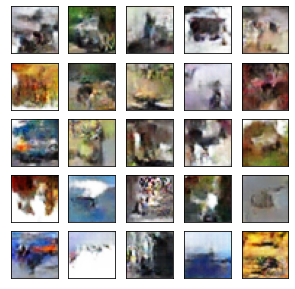

Epoch[252/300],d_loss:1.248854,g_loss:0.908564 D real: 0.588664,D fake: 0.409973
Epoch[252/300],d_loss:1.142251,g_loss:0.826344 D real: 0.551641,D fake: 0.443255
Epoch[252/300],d_loss:1.199675,g_loss:0.818765 D real: 0.555551,D fake: 0.446750
Epoch[252/300],d_loss:1.244897,g_loss:0.860235 D real: 0.539202,D fake: 0.429521


 84%|████████▍ | 253/300 [1:02:21<12:29, 15.95s/it]

Epoch[253/300],d_loss:1.200366,g_loss:0.971774 D real: 0.568584,D fake: 0.386676
Epoch[253/300],d_loss:1.122484,g_loss:0.814735 D real: 0.558380,D fake: 0.447924
Epoch[253/300],d_loss:1.210535,g_loss:0.741539 D real: 0.529771,D fake: 0.484508
Epoch[253/300],d_loss:1.199151,g_loss:0.727142 D real: 0.545793,D fake: 0.488140


 85%|████████▍ | 254/300 [1:02:35<11:40, 15.23s/it]

Epoch[254/300],d_loss:1.368010,g_loss:0.960831 D real: 0.570615,D fake: 0.389715
Epoch[254/300],d_loss:1.153297,g_loss:0.831770 D real: 0.522254,D fake: 0.439594
Epoch[254/300],d_loss:1.066163,g_loss:0.916016 D real: 0.577577,D fake: 0.404892
Epoch[254/300],d_loss:1.204043,g_loss:0.845294 D real: 0.537855,D fake: 0.438130


 85%|████████▌ | 255/300 [1:02:48<10:51, 14.48s/it]

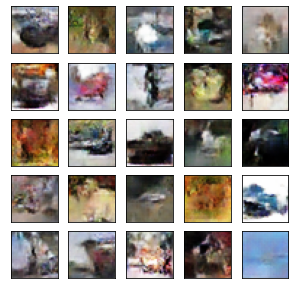

Epoch[255/300],d_loss:1.206865,g_loss:1.215114 D real: 0.629313,D fake: 0.329127
Epoch[255/300],d_loss:1.232422,g_loss:0.816297 D real: 0.543292,D fake: 0.449825
Epoch[255/300],d_loss:1.219931,g_loss:0.709713 D real: 0.499955,D fake: 0.496591
Epoch[255/300],d_loss:1.174021,g_loss:0.916987 D real: 0.582239,D fake: 0.407803


 85%|████████▌ | 256/300 [1:03:04<11:07, 15.16s/it]

Epoch[256/300],d_loss:1.164596,g_loss:0.812767 D real: 0.533926,D fake: 0.451297
Epoch[256/300],d_loss:1.172716,g_loss:0.990210 D real: 0.609728,D fake: 0.379104
Epoch[256/300],d_loss:1.195360,g_loss:0.849918 D real: 0.546640,D fake: 0.434374
Epoch[256/300],d_loss:1.217332,g_loss:0.844413 D real: 0.589730,D fake: 0.437933


 86%|████████▌ | 257/300 [1:03:20<10:51, 15.15s/it]

Epoch[257/300],d_loss:1.159367,g_loss:0.836293 D real: 0.586031,D fake: 0.438092
Epoch[257/300],d_loss:1.165806,g_loss:0.954260 D real: 0.589527,D fake: 0.392069
Epoch[257/300],d_loss:1.223536,g_loss:0.926055 D real: 0.589271,D fake: 0.403379
Epoch[257/300],d_loss:1.051503,g_loss:0.799929 D real: 0.575378,D fake: 0.457792


 86%|████████▌ | 258/300 [1:03:34<10:27, 14.93s/it]

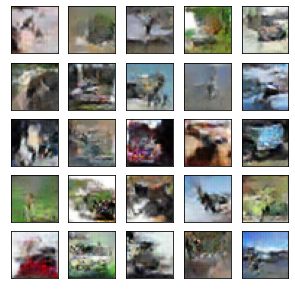

Epoch[258/300],d_loss:1.154821,g_loss:0.925874 D real: 0.580324,D fake: 0.403572
Epoch[258/300],d_loss:1.133284,g_loss:0.837059 D real: 0.552440,D fake: 0.438370
Epoch[258/300],d_loss:1.143518,g_loss:0.895378 D real: 0.572883,D fake: 0.414643
Epoch[258/300],d_loss:1.091047,g_loss:0.995590 D real: 0.618317,D fake: 0.378865


 86%|████████▋ | 259/300 [1:03:51<10:39, 15.61s/it]

Epoch[259/300],d_loss:1.221132,g_loss:0.937413 D real: 0.591111,D fake: 0.398883
Epoch[259/300],d_loss:1.075449,g_loss:0.810973 D real: 0.582476,D fake: 0.452661
Epoch[259/300],d_loss:1.103856,g_loss:0.877728 D real: 0.581332,D fake: 0.421969
Epoch[259/300],d_loss:1.067192,g_loss:0.786476 D real: 0.559613,D fake: 0.464966


 87%|████████▋ | 260/300 [1:04:07<10:24, 15.62s/it]

Epoch[260/300],d_loss:1.233504,g_loss:0.827187 D real: 0.546778,D fake: 0.445013
Epoch[260/300],d_loss:1.142979,g_loss:0.845679 D real: 0.526026,D fake: 0.440343
Epoch[260/300],d_loss:1.217677,g_loss:0.750455 D real: 0.555557,D fake: 0.482204
Epoch[260/300],d_loss:1.168816,g_loss:0.894602 D real: 0.574262,D fake: 0.416859


 87%|████████▋ | 261/300 [1:04:21<09:57, 15.31s/it]

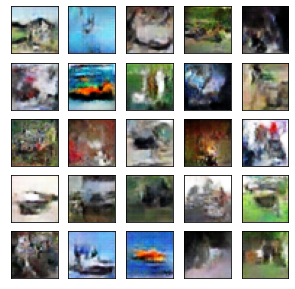

Epoch[261/300],d_loss:1.188035,g_loss:0.876948 D real: 0.537875,D fake: 0.432062
Epoch[261/300],d_loss:1.176161,g_loss:0.949005 D real: 0.575299,D fake: 0.394122
Epoch[261/300],d_loss:1.220566,g_loss:0.827844 D real: 0.534565,D fake: 0.445143
Epoch[261/300],d_loss:1.093213,g_loss:0.761011 D real: 0.557391,D fake: 0.474712


 87%|████████▋ | 262/300 [1:04:39<10:08, 16.01s/it]

Epoch[262/300],d_loss:1.377495,g_loss:0.897675 D real: 0.557149,D fake: 0.417369
Epoch[262/300],d_loss:1.070560,g_loss:0.920671 D real: 0.618910,D fake: 0.409118
Epoch[262/300],d_loss:1.292920,g_loss:0.705676 D real: 0.511053,D fake: 0.497846
Epoch[262/300],d_loss:1.162988,g_loss:1.133275 D real: 0.622190,D fake: 0.328260


 88%|████████▊ | 263/300 [1:04:53<09:34, 15.52s/it]

Epoch[263/300],d_loss:1.191507,g_loss:0.927975 D real: 0.571975,D fake: 0.402819
Epoch[263/300],d_loss:1.021955,g_loss:1.040982 D real: 0.599209,D fake: 0.359541
Epoch[263/300],d_loss:1.131710,g_loss:0.908089 D real: 0.635172,D fake: 0.411817
Epoch[263/300],d_loss:1.002328,g_loss:1.182034 D real: 0.663592,D fake: 0.314743


 88%|████████▊ | 264/300 [1:05:09<09:15, 15.42s/it]

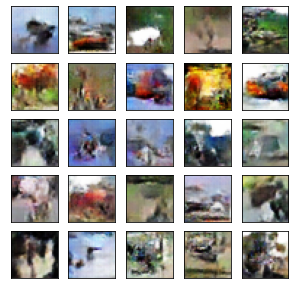

Epoch[264/300],d_loss:1.354136,g_loss:0.966763 D real: 0.530003,D fake: 0.390351
Epoch[264/300],d_loss:1.077172,g_loss:0.863869 D real: 0.552948,D fake: 0.429063
Epoch[264/300],d_loss:1.127658,g_loss:0.779312 D real: 0.535867,D fake: 0.469085
Epoch[264/300],d_loss:1.127314,g_loss:0.873918 D real: 0.567387,D fake: 0.426129


 88%|████████▊ | 265/300 [1:05:26<09:20, 16.01s/it]

Epoch[265/300],d_loss:1.310969,g_loss:1.052478 D real: 0.609991,D fake: 0.357265
Epoch[265/300],d_loss:1.304692,g_loss:0.717025 D real: 0.522102,D fake: 0.492492
Epoch[265/300],d_loss:1.193522,g_loss:0.890589 D real: 0.599635,D fake: 0.416091
Epoch[265/300],d_loss:1.092491,g_loss:1.076038 D real: 0.637808,D fake: 0.356403


 89%|████████▊ | 266/300 [1:05:42<09:05, 16.04s/it]

Epoch[266/300],d_loss:1.176366,g_loss:1.054406 D real: 0.625681,D fake: 0.354724
Epoch[266/300],d_loss:1.203806,g_loss:0.871748 D real: 0.554006,D fake: 0.423265
Epoch[266/300],d_loss:1.128955,g_loss:0.820517 D real: 0.564785,D fake: 0.448620
Epoch[266/300],d_loss:1.094709,g_loss:1.042982 D real: 0.604095,D fake: 0.365106


 89%|████████▉ | 267/300 [1:05:57<08:41, 15.79s/it]

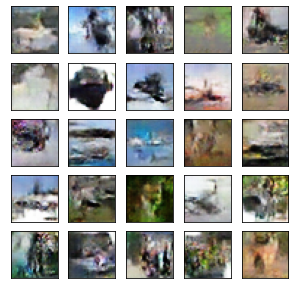

Epoch[267/300],d_loss:1.318003,g_loss:0.893011 D real: 0.600435,D fake: 0.418014
Epoch[267/300],d_loss:1.115723,g_loss:0.875418 D real: 0.573087,D fake: 0.422418
Epoch[267/300],d_loss:1.257042,g_loss:0.799944 D real: 0.523953,D fake: 0.455053
Epoch[267/300],d_loss:1.211424,g_loss:0.710826 D real: 0.533639,D fake: 0.495678


 89%|████████▉ | 268/300 [1:06:13<08:26, 15.83s/it]

Epoch[268/300],d_loss:1.258835,g_loss:0.985224 D real: 0.577974,D fake: 0.389363
Epoch[268/300],d_loss:1.121743,g_loss:0.935443 D real: 0.543620,D fake: 0.397271
Epoch[268/300],d_loss:1.128142,g_loss:0.830182 D real: 0.535061,D fake: 0.446394
Epoch[268/300],d_loss:1.124119,g_loss:0.972870 D real: 0.610138,D fake: 0.384961


 90%|████████▉ | 269/300 [1:06:26<07:44, 14.98s/it]

Epoch[269/300],d_loss:1.256382,g_loss:0.951606 D real: 0.573260,D fake: 0.391173
Epoch[269/300],d_loss:1.093198,g_loss:0.823491 D real: 0.573474,D fake: 0.452151
Epoch[269/300],d_loss:1.235953,g_loss:0.750621 D real: 0.489527,D fake: 0.480296
Epoch[269/300],d_loss:1.216908,g_loss:0.787354 D real: 0.527724,D fake: 0.464619


 90%|█████████ | 270/300 [1:06:41<07:26, 14.88s/it]

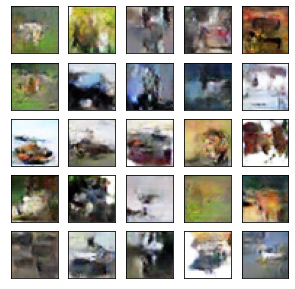

Epoch[270/300],d_loss:1.288050,g_loss:0.948054 D real: 0.558253,D fake: 0.402194
Epoch[270/300],d_loss:1.259631,g_loss:0.989094 D real: 0.567207,D fake: 0.381891
Epoch[270/300],d_loss:1.179185,g_loss:0.707781 D real: 0.520829,D fake: 0.496602
Epoch[270/300],d_loss:1.175893,g_loss:0.737381 D real: 0.521848,D fake: 0.483255


 90%|█████████ | 271/300 [1:06:58<07:33, 15.64s/it]

Epoch[271/300],d_loss:1.434089,g_loss:0.852945 D real: 0.549806,D fake: 0.433606
Epoch[271/300],d_loss:1.274890,g_loss:0.657539 D real: 0.483950,D fake: 0.521640
Epoch[271/300],d_loss:1.176621,g_loss:0.802994 D real: 0.562888,D fake: 0.452840
Epoch[271/300],d_loss:1.161242,g_loss:0.843246 D real: 0.545179,D fake: 0.438989


 91%|█████████ | 272/300 [1:07:14<07:18, 15.64s/it]

Epoch[272/300],d_loss:1.196864,g_loss:0.837176 D real: 0.495399,D fake: 0.440813
Epoch[272/300],d_loss:1.221652,g_loss:0.823071 D real: 0.543913,D fake: 0.444322
Epoch[272/300],d_loss:1.184975,g_loss:0.847947 D real: 0.572187,D fake: 0.435725
Epoch[272/300],d_loss:1.051526,g_loss:0.865772 D real: 0.592409,D fake: 0.425327


 91%|█████████ | 273/300 [1:07:28<06:52, 15.27s/it]

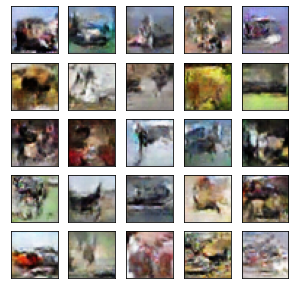

Epoch[273/300],d_loss:1.175943,g_loss:0.992231 D real: 0.580352,D fake: 0.376705
Epoch[273/300],d_loss:1.109950,g_loss:0.957945 D real: 0.578647,D fake: 0.393632
Epoch[273/300],d_loss:1.156214,g_loss:0.917221 D real: 0.591751,D fake: 0.407417
Epoch[273/300],d_loss:1.212737,g_loss:0.833287 D real: 0.580293,D fake: 0.441967


 91%|█████████▏| 274/300 [1:07:43<06:30, 15.01s/it]

Epoch[274/300],d_loss:1.252420,g_loss:1.031971 D real: 0.594465,D fake: 0.369315
Epoch[274/300],d_loss:1.273943,g_loss:0.756504 D real: 0.543543,D fake: 0.474876
Epoch[274/300],d_loss:1.104489,g_loss:0.882091 D real: 0.560466,D fake: 0.418498
Epoch[274/300],d_loss:1.190240,g_loss:0.827637 D real: 0.572577,D fake: 0.443558


 92%|█████████▏| 275/300 [1:07:58<06:18, 15.16s/it]

Epoch[275/300],d_loss:1.250940,g_loss:1.028155 D real: 0.597530,D fake: 0.364605
Epoch[275/300],d_loss:1.241366,g_loss:0.842349 D real: 0.580063,D fake: 0.438517
Epoch[275/300],d_loss:1.032442,g_loss:0.943235 D real: 0.597253,D fake: 0.396997
Epoch[275/300],d_loss:1.260519,g_loss:0.868629 D real: 0.554978,D fake: 0.424693


 92%|█████████▏| 276/300 [1:08:12<05:55, 14.82s/it]

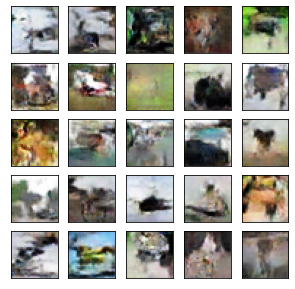

Epoch[276/300],d_loss:1.242945,g_loss:1.025880 D real: 0.568048,D fake: 0.363153
Epoch[276/300],d_loss:1.202733,g_loss:0.937959 D real: 0.603108,D fake: 0.397123
Epoch[276/300],d_loss:1.192976,g_loss:0.820691 D real: 0.548373,D fake: 0.444749
Epoch[276/300],d_loss:1.183100,g_loss:0.837762 D real: 0.559613,D fake: 0.440103


 92%|█████████▏| 277/300 [1:08:30<06:02, 15.77s/it]

Epoch[277/300],d_loss:1.268073,g_loss:1.179265 D real: 0.663152,D fake: 0.312968
Epoch[277/300],d_loss:1.211385,g_loss:0.847004 D real: 0.539662,D fake: 0.438256
Epoch[277/300],d_loss:1.192711,g_loss:0.821850 D real: 0.582869,D fake: 0.447899
Epoch[277/300],d_loss:1.159237,g_loss:0.899645 D real: 0.608384,D fake: 0.418036


 93%|█████████▎| 278/300 [1:08:46<05:45, 15.69s/it]

Epoch[278/300],d_loss:1.376280,g_loss:0.846723 D real: 0.544908,D fake: 0.437830
Epoch[278/300],d_loss:1.223667,g_loss:0.854687 D real: 0.522150,D fake: 0.434524
Epoch[278/300],d_loss:1.192161,g_loss:0.892672 D real: 0.574267,D fake: 0.414948
Epoch[278/300],d_loss:1.234311,g_loss:0.870167 D real: 0.565049,D fake: 0.425310


 93%|█████████▎| 279/300 [1:09:01<05:27, 15.58s/it]

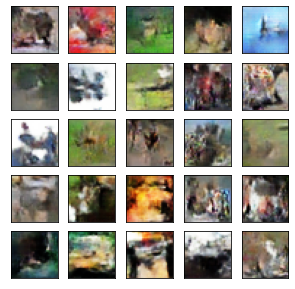

Epoch[279/300],d_loss:1.306855,g_loss:0.799307 D real: 0.529330,D fake: 0.458617
Epoch[279/300],d_loss:1.155621,g_loss:0.804773 D real: 0.518397,D fake: 0.453838
Epoch[279/300],d_loss:1.153029,g_loss:0.820545 D real: 0.555967,D fake: 0.446440
Epoch[279/300],d_loss:1.195074,g_loss:0.714650 D real: 0.542617,D fake: 0.495890


 93%|█████████▎| 280/300 [1:09:16<05:10, 15.51s/it]

Epoch[280/300],d_loss:1.188551,g_loss:1.098704 D real: 0.615532,D fake: 0.343147
Epoch[280/300],d_loss:1.031391,g_loss:0.847710 D real: 0.571522,D fake: 0.436157
Epoch[280/300],d_loss:1.117689,g_loss:0.743131 D real: 0.539184,D fake: 0.480894
Epoch[280/300],d_loss:1.160704,g_loss:0.893140 D real: 0.608575,D fake: 0.420100


 94%|█████████▎| 281/300 [1:09:32<04:53, 15.46s/it]

Epoch[281/300],d_loss:1.256869,g_loss:0.903902 D real: 0.589325,D fake: 0.413062
Epoch[281/300],d_loss:1.041780,g_loss:1.117306 D real: 0.637686,D fake: 0.340628
Epoch[281/300],d_loss:1.113022,g_loss:0.949362 D real: 0.583802,D fake: 0.394463
Epoch[281/300],d_loss:1.133519,g_loss:0.857393 D real: 0.551820,D fake: 0.433715


 94%|█████████▍| 282/300 [1:09:47<04:35, 15.33s/it]

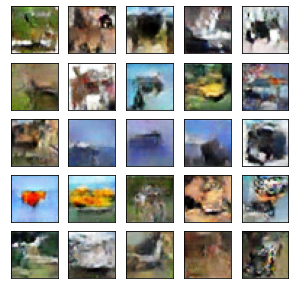

Epoch[282/300],d_loss:1.265110,g_loss:0.842478 D real: 0.518181,D fake: 0.446035
Epoch[282/300],d_loss:1.201934,g_loss:0.776969 D real: 0.530004,D fake: 0.467167
Epoch[282/300],d_loss:1.281762,g_loss:0.778909 D real: 0.509110,D fake: 0.464965
Epoch[282/300],d_loss:1.012022,g_loss:1.002081 D real: 0.581713,D fake: 0.375597


 94%|█████████▍| 283/300 [1:10:01<04:13, 14.93s/it]

Epoch[283/300],d_loss:1.304933,g_loss:0.778300 D real: 0.550255,D fake: 0.466805
Epoch[283/300],d_loss:1.215559,g_loss:0.728081 D real: 0.518585,D fake: 0.488991
Epoch[283/300],d_loss:1.218438,g_loss:0.797374 D real: 0.529056,D fake: 0.460835
Epoch[283/300],d_loss:1.124291,g_loss:0.972767 D real: 0.575179,D fake: 0.390602


 95%|█████████▍| 284/300 [1:10:15<03:55, 14.73s/it]

Epoch[284/300],d_loss:1.348050,g_loss:0.969092 D real: 0.596340,D fake: 0.390726
Epoch[284/300],d_loss:1.162268,g_loss:0.938170 D real: 0.587980,D fake: 0.399223
Epoch[284/300],d_loss:1.240812,g_loss:0.853693 D real: 0.548992,D fake: 0.432760
Epoch[284/300],d_loss:1.248084,g_loss:0.717238 D real: 0.501590,D fake: 0.498090


 95%|█████████▌| 285/300 [1:10:30<03:41, 14.74s/it]

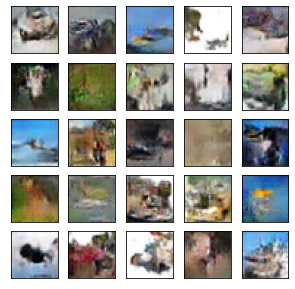

Epoch[285/300],d_loss:1.205316,g_loss:1.017120 D real: 0.616395,D fake: 0.370007
Epoch[285/300],d_loss:1.080796,g_loss:0.924393 D real: 0.641970,D fake: 0.403964
Epoch[285/300],d_loss:1.300369,g_loss:0.867903 D real: 0.556128,D fake: 0.429206
Epoch[285/300],d_loss:1.202157,g_loss:0.841744 D real: 0.567670,D fake: 0.437791


 95%|█████████▌| 286/300 [1:10:48<03:41, 15.79s/it]

Epoch[286/300],d_loss:1.280212,g_loss:0.857897 D real: 0.522007,D fake: 0.429931
Epoch[286/300],d_loss:1.207247,g_loss:0.737866 D real: 0.542343,D fake: 0.485993
Epoch[286/300],d_loss:1.144631,g_loss:0.870321 D real: 0.578468,D fake: 0.422352
Epoch[286/300],d_loss:1.135750,g_loss:0.777015 D real: 0.561815,D fake: 0.467261


 96%|█████████▌| 287/300 [1:11:03<03:22, 15.60s/it]

Epoch[287/300],d_loss:1.233451,g_loss:0.771404 D real: 0.509470,D fake: 0.468414
Epoch[287/300],d_loss:1.174570,g_loss:0.903858 D real: 0.546384,D fake: 0.409528
Epoch[287/300],d_loss:1.282158,g_loss:0.757694 D real: 0.536673,D fake: 0.474015
Epoch[287/300],d_loss:1.144534,g_loss:0.924672 D real: 0.592344,D fake: 0.402659


 96%|█████████▌| 288/300 [1:11:20<03:11, 15.99s/it]

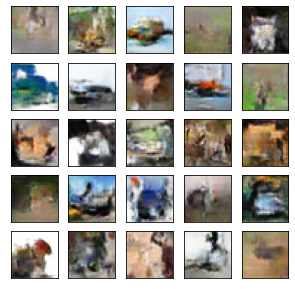

Epoch[288/300],d_loss:1.244035,g_loss:0.755287 D real: 0.521050,D fake: 0.474142
Epoch[288/300],d_loss:1.094068,g_loss:0.854720 D real: 0.533541,D fake: 0.434390
Epoch[288/300],d_loss:1.049545,g_loss:0.924990 D real: 0.600256,D fake: 0.408025
Epoch[288/300],d_loss:1.011696,g_loss:1.073395 D real: 0.647880,D fake: 0.351156


 96%|█████████▋| 289/300 [1:11:38<03:00, 16.44s/it]

Epoch[289/300],d_loss:1.264071,g_loss:0.921527 D real: 0.541004,D fake: 0.403533
Epoch[289/300],d_loss:1.096266,g_loss:0.932506 D real: 0.609688,D fake: 0.402894
Epoch[289/300],d_loss:1.139341,g_loss:0.880449 D real: 0.593898,D fake: 0.422457
Epoch[289/300],d_loss:1.187182,g_loss:0.795946 D real: 0.551181,D fake: 0.457920


 97%|█████████▋| 290/300 [1:11:54<02:43, 16.31s/it]

Epoch[290/300],d_loss:1.368170,g_loss:1.046472 D real: 0.555552,D fake: 0.360581
Epoch[290/300],d_loss:1.213068,g_loss:0.754144 D real: 0.544162,D fake: 0.475396
Epoch[290/300],d_loss:1.357503,g_loss:0.732106 D real: 0.510785,D fake: 0.484727
Epoch[290/300],d_loss:1.258933,g_loss:0.802124 D real: 0.559492,D fake: 0.453661


 97%|█████████▋| 291/300 [1:12:08<02:21, 15.77s/it]

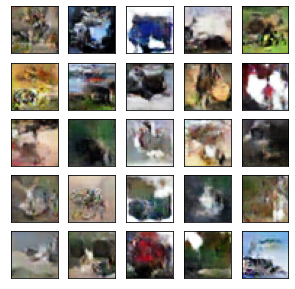

Epoch[291/300],d_loss:1.353310,g_loss:0.772421 D real: 0.558322,D fake: 0.469595
Epoch[291/300],d_loss:1.087321,g_loss:0.886183 D real: 0.562518,D fake: 0.417916
Epoch[291/300],d_loss:1.118973,g_loss:0.819763 D real: 0.562126,D fake: 0.447439
Epoch[291/300],d_loss:1.155805,g_loss:0.846808 D real: 0.623835,D fake: 0.434941


 97%|█████████▋| 292/300 [1:12:25<02:09, 16.18s/it]

Epoch[292/300],d_loss:1.257626,g_loss:1.037412 D real: 0.609055,D fake: 0.362910
Epoch[292/300],d_loss:1.325648,g_loss:0.753588 D real: 0.550120,D fake: 0.477751
Epoch[292/300],d_loss:1.324397,g_loss:0.710809 D real: 0.513236,D fake: 0.500159
Epoch[292/300],d_loss:1.254070,g_loss:0.745412 D real: 0.517030,D fake: 0.481813


 98%|█████████▊| 293/300 [1:12:39<01:48, 15.54s/it]

Epoch[293/300],d_loss:1.247107,g_loss:0.861157 D real: 0.566443,D fake: 0.431630
Epoch[293/300],d_loss:1.286960,g_loss:0.671266 D real: 0.548454,D fake: 0.516122
Epoch[293/300],d_loss:1.273080,g_loss:0.693906 D real: 0.481800,D fake: 0.505088
Epoch[293/300],d_loss:1.048913,g_loss:1.065787 D real: 0.634983,D fake: 0.350207


 98%|█████████▊| 294/300 [1:12:54<01:31, 15.29s/it]

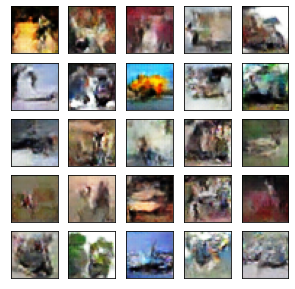

Epoch[294/300],d_loss:1.230604,g_loss:0.893171 D real: 0.589103,D fake: 0.416061
Epoch[294/300],d_loss:1.067304,g_loss:0.728417 D real: 0.510462,D fake: 0.490108
Epoch[294/300],d_loss:1.170183,g_loss:0.718813 D real: 0.525761,D fake: 0.492698
Epoch[294/300],d_loss:1.165659,g_loss:0.877537 D real: 0.594088,D fake: 0.421539


 98%|█████████▊| 295/300 [1:13:11<01:18, 15.72s/it]

Epoch[295/300],d_loss:1.235911,g_loss:0.858215 D real: 0.535619,D fake: 0.430108
Epoch[295/300],d_loss:1.242617,g_loss:0.711609 D real: 0.509710,D fake: 0.497428
Epoch[295/300],d_loss:1.218389,g_loss:0.754726 D real: 0.537141,D fake: 0.475070
Epoch[295/300],d_loss:1.170891,g_loss:0.828131 D real: 0.553344,D fake: 0.441284


 99%|█████████▊| 296/300 [1:13:25<01:01, 15.43s/it]

Epoch[296/300],d_loss:1.228164,g_loss:0.901642 D real: 0.573454,D fake: 0.414237
Epoch[296/300],d_loss:1.208046,g_loss:0.898517 D real: 0.551144,D fake: 0.417325
Epoch[296/300],d_loss:1.257742,g_loss:0.778338 D real: 0.555495,D fake: 0.466970
Epoch[296/300],d_loss:1.251572,g_loss:0.815922 D real: 0.515326,D fake: 0.446066


 99%|█████████▉| 297/300 [1:13:39<00:45, 15.01s/it]

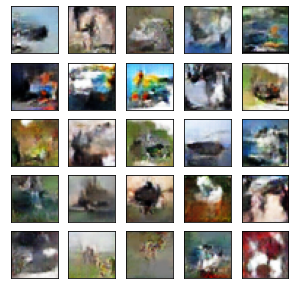

Epoch[297/300],d_loss:1.285083,g_loss:0.912696 D real: 0.535256,D fake: 0.414358
Epoch[297/300],d_loss:1.163825,g_loss:0.768808 D real: 0.537344,D fake: 0.475629
Epoch[297/300],d_loss:1.111358,g_loss:0.859627 D real: 0.553709,D fake: 0.427872
Epoch[297/300],d_loss:1.085283,g_loss:0.966362 D real: 0.608130,D fake: 0.387257


 99%|█████████▉| 298/300 [1:13:51<00:28, 14.02s/it]

Epoch[298/300],d_loss:1.199462,g_loss:1.001617 D real: 0.603265,D fake: 0.372653
Epoch[298/300],d_loss:1.046826,g_loss:0.945776 D real: 0.615939,D fake: 0.394537
Epoch[298/300],d_loss:1.214938,g_loss:0.779762 D real: 0.550676,D fake: 0.465018
Epoch[298/300],d_loss:1.114434,g_loss:0.908045 D real: 0.571254,D fake: 0.414465


100%|█████████▉| 299/300 [1:14:07<00:14, 14.59s/it]

Epoch[299/300],d_loss:1.199671,g_loss:0.942424 D real: 0.602534,D fake: 0.398225
Epoch[299/300],d_loss:1.115672,g_loss:0.910818 D real: 0.577069,D fake: 0.409187
Epoch[299/300],d_loss:1.273663,g_loss:0.762262 D real: 0.527850,D fake: 0.475491
Epoch[299/300],d_loss:1.140295,g_loss:0.903507 D real: 0.552172,D fake: 0.414337


100%|██████████| 300/300 [1:14:23<00:00, 14.88s/it]


"    if epoch == 0:\n        real_images = inv_normalize(real_img.cpu().data)\n        save_image(real_images, '../../img/real_images.png')\n \n    fake_images = inv_normalize(fake_img.cpu().data)\n    save_image(fake_images, '../../img/fake_images-{}.png'.format(epoch+1))"

In [10]:
G_losses = []
D_losses = []

for epoch in tqdm(range(num_epoch)):
    if epoch % 3 == 0:
        G.eval()
        z = torch.randn(25, z_dim,1,1).to(device)
        img = G(z)
        plt.close()
        grid_size, k = int(img.shape[0] ** 0.5), 0 # 10 * 10
        fig, ax = plt.subplots(grid_size, grid_size, figsize=(5, 5))
        for i, j in product(range(grid_size), range(grid_size)): # to draw 10 * 10 images
            ax[i,j].get_xaxis().set_visible(False)
            ax[i,j].get_yaxis().set_visible(False)
            ax[i,j].imshow((inv_normalize(img[k]) * 255).data.cpu().numpy().transpose((1,2,0)).astype(np.uint8))
            k += 1
        plt.show()
    for i, (img, _) in enumerate(dataloader): # Since we don't need any labels, we make label be '_'

        # =============================== IMAGES =================================
        num_img = img.size(0) 
        #img = img.view(num_img, -1) # view()函数作用是将一个多行的Tensor,拼接成一行
                                    # 第一个参数是要拼接的tensor,第二个参数是-1
        # After view(), the input image will be a vector as 28 * 28 = 782 dimensions
        real_img = img.to(device) # the sampled data are real images
        # =============================== LABELS =================================
        real_label = (torch.ones(num_img) - softlabel).view(-1, 1).to(device) # Label of real images is 1
        fake_label = torch.zeros(num_img).view(-1, 1).to(device) # label of real images is 0

        # ========================= D: Forward and Loss ==========================
        
        real_out = D(real_img).view(-1,1)
        d_loss_real = criterion(real_out, real_label) 
        
        z = torch.randn(num_img, z_dim, 1, 1).to(device)
        #z = torch.randn(num_img, z_dim, 1, 1)
        
        fake_img = G(z)
        fake_out = D(fake_img).view(-1,1)
        d_loss_fake = criterion(fake_out, fake_label)
        
        d_loss = d_loss_real + d_loss_fake
        d_optimizer.zero_grad() # before back propagation
        d_loss.backward()
        d_optimizer.step()
        
        if(i % D_step == 0):
            # =============== G ========================
            # To fool the Discriminator, we want G's fake output can get 'real' pridection
            z = torch.randn(num_img, z_dim, 1, 1).to(device)
            # z = torch.randn(num_img, z_dim, 1, 1)

            fake_img = G(z)
            fake_out = D(fake_img).view(-1,1)
            g_loss = criterion(fake_out, real_label)

            g_optimizer.zero_grad()
            g_loss.backward()
            g_optimizer.step()
            D_losses.append(d_loss)
            G_losses.append(g_loss)
            # ============= Visualization ===============
        if i%100 == 0:
            print('Epoch[{}/{}],d_loss:{:.6f},g_loss:{:.6f} '
                  'D real: {:.6f},D fake: {:.6f}'.format(
                epoch,num_epoch,d_loss.item(),g_loss.item(),
                real_out.data.mean(),fake_out.data.mean()  #打印的是真实图片的损失均值
            ))
        
'''    if epoch == 0:
        real_images = inv_normalize(real_img.cpu().data)
        save_image(real_images, '../../img/real_images.png')
 
    fake_images = inv_normalize(fake_img.cpu().data)
    save_image(fake_images, '../../img/fake_images-{}.png'.format(epoch+1))'''

# Visualization

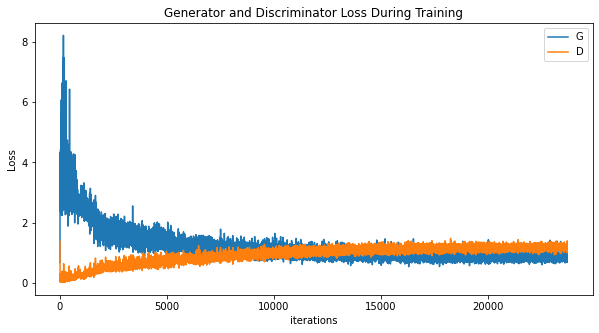

In [11]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

# Debug 专区